# The New Zealand Ground Motion Database: Declustering Analysis - Abrahamson & Woodell
***
In this code we carry out a declustering analysis  of the New Zealand Ground Motion Database (NZGMDB) utilizing the Abrahamson & Woodell method. The framework behind creating these functions was defined in another Jupyter Notebook titled: "ABWD_DISTANCE" but is summarized via python functions in the file: abwd_declust.py. For brevity, the Abrhamson & Woodell method simply modifies the circular distance window employed by Garnder & Knopoff (as well as others) as depicted in the figure below. However, the time-window function is kept as per the Gardner & Knopoff definition.

![Image](abwd_distance.png)

In this regard, the method is broken up into three (3) different functions as denoted by the various alterations in the previous figure as follows:

1. abwd_crjb
2. abwd_rclosestp2p
3. abwd_rclosestp2h

It should be noted that although the authors of the method utilize the Garnder & Knopoff time-distance-windows as the base, the functions also allow for the user to utilize other time-distance-windows such as those defined by Gruethal and Urhammer.

In terms of inputs, a sample catalogue is presented to understand the manner in which it should be curated to be utilized with the functions. Alternatively, the functions can be edited to utilize different titles since the catalogue is read as a Pandas DataFrame. However, the main input of this method is to have corner coordinates of the ruptures within the catalogue. Therefore, these rupture areas must be made into polygons prior to utilization of the functions.

**Table of Contents**

[1. Import Modules](#1-import-modules)

[2. Import Earthquake Catalogue](#2-import-earthquake-catalogue)

[3. Declustering Analysis](#3-declustering-analysis)

[4. FMD and ERD Plots](#4-fmd-and-erd-plots)

[5. Original Catalogue FMD/ERD Plots](#5-orginal-catalogue-fmd-erd)

[6. Spatial Plots of Results](#6-spatial-plots-of-results)

# 1.0 Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from pathlib import Path
from shapely import MultiPoint, Polygon, affinity, geometry
import alphashape
from scipy.spatial import ConvexHull

In [2]:
from abwd_declust.abwd_declust_v2_1 import abwd_crjb, abwd_rclosestp2h, abwd_rclosestp2p

## 1.1 Import Post-Processing Functions

In [3]:
import math

def ftd(time, tbin):

    """
    calculates the cumulative number of events in
    each time bin to identify possible aftershock sequences
    """

    mintime = math.floor(min(time/tbin)) * tbin # Lowest time bin
    maxtime = math.ceil(max(time/tbin)) * tbin # Highest time bin
    ti = np.arange(mintime, maxtime + tbin, tbin) # Sequence of time bins
    nbt = len(ti) # No. of time bins
    cumnbt = np.zeros(nbt) # Pre-allocate array for cumulative no. of events in time bin and higher

    # Get cumulative no. of events in mag bin and higher
    for i in range(nbt):
        cumnbt[i] = np.where(time > ti[i] - tbin/2)[0].shape[0]

    # Get no. of events in each time bin:
    nbt = abs(np.diff(np.append(cumnbt, 0)))
    cumnbt = np.cumsum(nbt)

    return ti, nbt, cumnbt # Return time bins, no. of events in bin, and cumulative no. of events

def fmd(mag, mbin):

    """
    calculates the cumulative number of events in
    each magnitude bin to identify possible aftershock sequences
    and determine overall poissonian behaviour
    """
    minmag = math.floor(min(mag/mbin)) * mbin # Lowest magnitude bin
    maxmag = math.ceil(max(mag/mbin)) * mbin # Highest magnitude bin
    mi = np.arange(minmag, maxmag + mbin, mbin) # Sequence of magnitude bins
    nbm = len(mi) # No. of magnitude bins
    cumnbmag = np.zeros(nbm) # Pre-allocate array for cumulative no. of events in mag bin and higher

    # Get cumulative no. of events in mag bin and higher
    for i in range(nbm):
        cumnbmag[i] = np.where(mag > mi[i] - mbin/2)[0].shape[0]

    # Get no. of events in each mag bin:
    nbmag = abs(np.diff(np.append(cumnbmag, 0)))

    return mi, nbmag, cumnbmag # Return magnitude bins, no. of events in bin, and cumulative no. of events

def decimalyear(catalog_org):
    from datetime import datetime as dt
    import time
    def toYearFraction(date):
        def sinceEpoch(date): # returns seconds since epoch
            return time.mktime(date.timetuple())
        s = sinceEpoch

        year = date.year
        startOfThisYear = dt(year=year, month=1, day=1)
        startOfNextYear = dt(year=year+1, month=1, day=1)

        yearElapsed = s(date) - s(startOfThisYear)
        yearDuration = s(startOfNextYear) - s(startOfThisYear)
        fraction = yearElapsed/yearDuration

        return date.year + fraction

    time_pd = pd.to_datetime(catalog_org.datetime,format = 'ISO8601')
    time_pd.reset_index(drop = True, inplace = True)
    dtime_orig = []

    for i in range(len(time_pd)):
        temp_orig = toYearFraction(time_pd[i])
        dtime_orig.append(temp_orig)

    return dtime_orig

# 2.0 Import Earthquake Catalog with Rupture Area Coordinates

There was a minor issue with the rupture area export from ccldpy which resulted in the incorrect sign being applied to the longitude. As a result at the import step we simply change the sign to its correct orientation. Additionally, sometimes for larger magnitude events, the rupture areas are stored in a seperate format and thus requires some slight post-processing prior to utilization.

## 2.1 Create Polygon for External Rupture Areas

### 2.1.1 Function for Creating Hull around rupture vertices

In [4]:
def surfruppoly(nodal_plane):
    nodal_plane_vertices = np.transpose(np.array([nodal_plane[:,0], nodal_plane[:,1]]))
    hull = ConvexHull(nodal_plane_vertices)
    alphashape2 = alphashape.alphashape(nodal_plane_vertices,0.)
    x, y = alphashape2.exterior.xy

    return x, y, hull

### 2.1.2 Shapely Polygon Creation From Hull

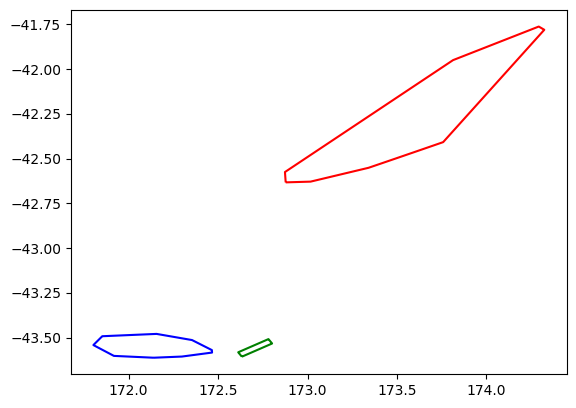

In [5]:
nodal_plane_2016p858000 = np.load('nodal_plane_2016p858000.npy')
nodal_plane_3366146 = np.load('nodal_plane_3366146.npy')
nodal_plane_3468575 = np.load('nodal_plane_3468575.npy')

x_2016p858000, y_2016p858000, hull_2016p858000 = surfruppoly(nodal_plane_2016p858000)
x_3366146, y_3366146, hull_3366146 = surfruppoly(nodal_plane_3366146)
x_3468575, y_3468575, hull_3468575 = surfruppoly(nodal_plane_3468575)

rupture_area_2016p858000 = Polygon(zip(x_2016p858000,y_2016p858000))
rupture_area_3366146 = Polygon(zip(x_3366146,y_3366146))
rupture_area_3468575 = Polygon(zip(x_3468575,y_3468575))

fig, ax = plt.subplots()
gpd.GeoSeries(rupture_area_2016p858000).boundary.plot(ax=ax,color='red', label = '2016p858000')
gpd.GeoSeries(rupture_area_3366146).boundary.plot(ax=ax, color = 'blue', label = '3366146')
gpd.GeoSeries(rupture_area_3468575).boundary.plot(ax=ax, color = 'green',label = '3468575')
plt.show()

## 2.2 Import Catalogue with Other Rupture Areas

The earthquake rupture areas for this specific analysis was obtained from "ccldpy" (https://github.com/tristanbuckreis/ccldpy/blob/main/ccldpy.py). Since ccldpy shifts the hypocentre to the origin i.e., latitude = 0 and longitude = 0, it is therefore important to recognize that errors can occur during the delineation of the corners of the rupture.

In [6]:
# file = Path(r'C:\Users\LEGION\OneDrive - University of Canterbury\Python_V1\phd_data\NZGMDBV4P1_fault_plane_table_orig.csv')
file = Path(r'C:\Users\LEGION\OneDrive - University of Canterbury\Python_V1\phd_data\NZGMDBV4P1_earthquake_source_table_plane.csv')
catalogue_pd = pd.read_csv(file)
catalogue_pd.hyp_lon = np.abs(catalogue_pd.hyp_lon)
catalogue_pd.corner_0_lon = np.abs(catalogue_pd.corner_0_lon)
catalogue_pd.corner_1_lon = np.abs(catalogue_pd.corner_1_lon)
catalogue_pd.corner_2_lon = np.abs(catalogue_pd.corner_2_lon)
catalogue_pd.corner_3_lon = np.abs(catalogue_pd.corner_3_lon)
catalogue_pd

,evid,datetime,lat,lon,depth,loc_type,loc_grid,mag,mag_type,mag_method,...,corner_0_depth,corner_1_lat,corner_1_lon,corner_1_depth,corner_2_lat,corner_2_lon,corner_2_depth,corner_3_lat,corner_3_lon,corner_3_depth
0,1476956,2000-01-18T05:37:07.707000Z,-45.082980,167.451920,5.000000,GROPE,nz1dr,4.157000,ML,uncorrected,...,4614.512326,-45.076366,167.452633,4614.512326,-45.088991,167.449882,5293.449601,-45.082223,167.460251,5293.449601
1,1485433,2000-02-02T03:27:19.581000Z,-44.460690,168.062580,5.000000,GROPE,nz1dr,4.509000,ML,uncorrected,...,4157.436091,-44.470501,168.062896,4157.436091,-44.452650,168.063406,5566.056733,-44.466926,168.053172,5566.056733
2,1486082,2000-02-05T03:18:15.538000Z,-40.395360,175.611880,47.895000,GROPE,nz1dr,4.178000,ML,uncorrected,...,47124.857200,-40.387450,175.614263,47124.857200,-40.403663,175.609140,48671.228280,-40.391683,175.621361,48671.228280
3,1489136,2000-02-11T10:34:05.214000Z,-42.104340,174.676730,31.802300,GROPE,nz1dr,4.152000,ML,uncorrected,...,31074.848370,-42.108488,174.673238,31074.848370,-42.099769,174.680975,32094.422270,-42.108206,174.672717,32094.422270
4,1493377,2000-02-26T02:56:04.133000Z,-40.926720,174.460970,74.251700,GROPE,nz1dr,4.552000,ML,uncorrected,...,73176.580460,-40.914889,174.471603,73176.580460,-40.935500,174.457393,75428.238160,-40.923948,174.479743,75428.238160
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4825,2024p423234,2024-06-05T14:19:45.626015Z,-38.168100,176.067100,184.000000,CMT,CMT,4.800000,Mw,CMT,...,183227.878100,-38.159103,176.049167,183227.878100,-38.172725,176.087574,186178.500500,-38.151818,176.057220,186178.500500
4826,2024p437975,2024-06-11T01:13:24.995915Z,-36.859745,177.041672,225.662720,LOCSAT,iasp91,4.029576,MLv,uncorrected,...,225001.706400,-36.853669,177.041039,225001.706400,-36.865080,177.041272,226117.029100,-36.856616,177.047371,226117.029100
4827,2024p455682,2024-06-17T14:27:23.023784Z,-37.129337,177.016922,237.793671,LOCSAT,iasp91,4.418436,MLv,uncorrected,...,236973.862500,-37.117945,177.019686,236973.862500,-37.141015,177.016457,238833.575700,-37.126711,177.032150,238833.575700
4828,2024p486281,2024-06-28T22:10:34.633843Z,-39.734500,176.947400,16.000000,CMT,CMT,3.800000,Mw,CMT,...,15504.839520,-39.737373,176.942412,15504.839520,-39.731707,176.954152,16433.827620,-39.733161,176.941595,16433.827620


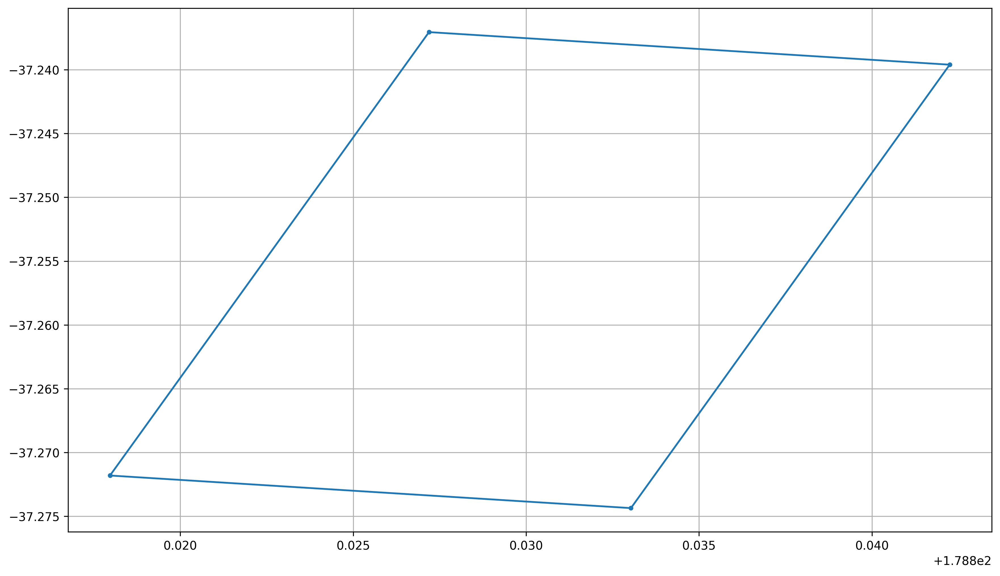

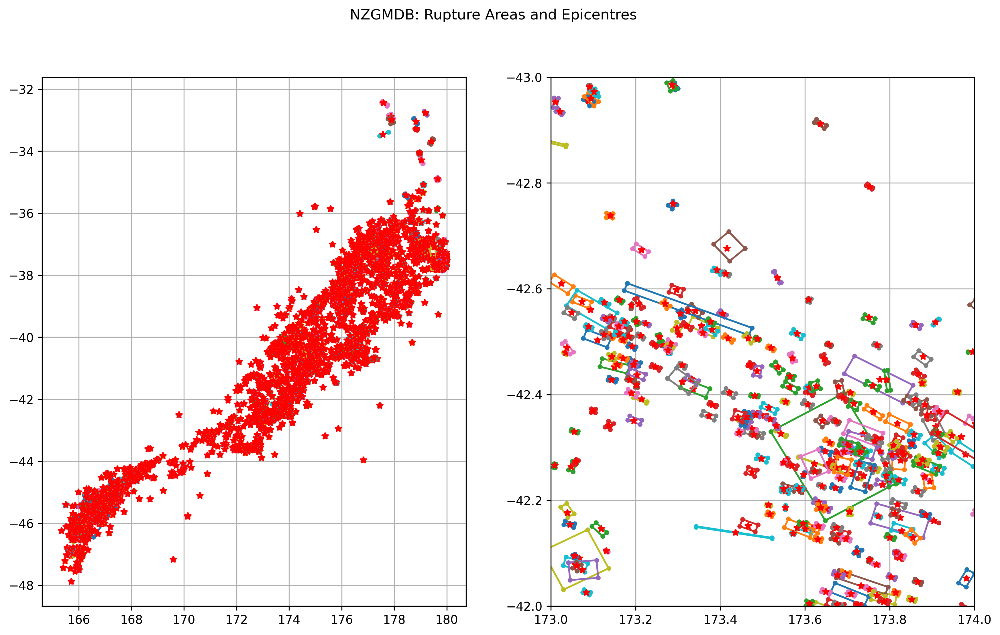

In [7]:
rupture_area = [[catalogue_pd.corner_0_lon[3058],catalogue_pd.corner_1_lon[3058],catalogue_pd.corner_3_lon[3058],catalogue_pd.corner_2_lon[3058],catalogue_pd.corner_0_lon[3058]],[catalogue_pd.corner_0_lat[3058],catalogue_pd.corner_1_lat[3058],catalogue_pd.corner_3_lat[3058],catalogue_pd.corner_2_lat[3058],catalogue_pd.corner_0_lat[3058]]]

plt.figure(figsize=(14,8),dpi=300)
plt.plot(rupture_area[0],rupture_area[1],'.-')
plt.grid(True)
plt.show()

# plt.subplot(1,1,figsize= (10,10))
fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(14,8),dpi=300)
for i in range(len(catalogue_pd)):
    rupture_area = [[catalogue_pd.corner_0_lon[i],catalogue_pd.corner_1_lon[i],catalogue_pd.corner_3_lon[i],catalogue_pd.corner_2_lon[i],catalogue_pd.corner_0_lon[i]],[catalogue_pd.corner_0_lat[i],catalogue_pd.corner_1_lat[i],catalogue_pd.corner_3_lat[i],catalogue_pd.corner_2_lat[i],catalogue_pd.corner_0_lat[i]]]
    ax1.plot(rupture_area[0],rupture_area[1],'.-')
    ax1.plot(catalogue_pd.hyp_lon[i],catalogue_pd.hyp_lat[i],'*r')
    ax2.plot(rupture_area[0],rupture_area[1],'.-')
    ax2.plot(catalogue_pd.hyp_lon[i],catalogue_pd.hyp_lat[i],'*r')
ax2.set_xlim([173,174])
ax2.set_ylim([-42,-43])
ax1.grid(True)
ax2.grid(True)
plt.suptitle('NZGMDB: Rupture Areas and Epicentres')
plt.show()

## 2.3 Create Shapely Polygons from Rupture Areas (and merge external ruptures)

The external ruptures usually aren't a large quantity and therefore can be "manually" spliced into the Shapely Polygon list.

In [8]:
srf_rup_id = ['2016p858000','3366146','3468575']
srf_rup_idx = []
for i in range(len(catalogue_pd)):
    if catalogue_pd.evid[i] in srf_rup_id:
        idx = i
    else:
        continue
    srf_rup_idx.append(idx)

rupture_area_poly = []
for i in range(len(catalogue_pd)):
    if i == srf_rup_idx[0]:
        rupture_area_temp = rupture_area_2016p858000
    elif i == srf_rup_idx[1]:
        rupture_area_temp = rupture_area_3366146
    elif i == srf_rup_idx[2]:
        rupture_area_temp = rupture_area_3468575
    else:

        rupture_area = [[catalogue_pd.corner_0_lon[i],catalogue_pd.corner_1_lon[i],catalogue_pd.corner_3_lon[i],catalogue_pd.corner_2_lon[i],catalogue_pd.corner_0_lon[i]],[catalogue_pd.corner_0_lat[i],catalogue_pd.corner_1_lat[i],catalogue_pd.corner_3_lat[i],catalogue_pd.corner_2_lat[i],catalogue_pd.corner_0_lat[i]]]
        rupture_area_temp = Polygon(zip(rupture_area[0],rupture_area[1]))
    rupture_area_poly.append(rupture_area_temp)

# 3.0 Declustering Analysis

## 3.1 crjb: Rupture-Centroid to Surface Rupture Projection

In [9]:
flagvector_crjb0, vcl_crjb0 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=0, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 0km' % np.max(vcl_crjb0))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 0km' % np.sum(flagvector_crjb0 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 0km' % np.sum(flagvector_crjb0==0.0))

flagvector_crjb2, vcl_crjb2 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=2, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 2km' % np.max(vcl_crjb2))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 2km' % np.sum(flagvector_crjb2 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 2km' % np.sum(flagvector_crjb2==0.0))

flagvector_crjb5, vcl_crjb5 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=5, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 5km' % np.max(vcl_crjb5))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 5km' % np.sum(flagvector_crjb5 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 5km' % np.sum(flagvector_crjb5==0.0))

flagvector_crjb10, vcl_crjb10 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=10, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 10km' % np.max(vcl_crjb10))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 10km' % np.sum(flagvector_crjb10 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 10km' % np.sum(flagvector_crjb10==0.0))

flagvector_crjb20, vcl_crjb20 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=20, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 20km' % np.max(vcl_crjb20))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 20km' % np.sum(flagvector_crjb20 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 20km' % np.sum(flagvector_crjb20==0.0))

flagvector_crjb30, vcl_crjb30 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=30, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 30km' % np.max(vcl_crjb30))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 30km' % np.sum(flagvector_crjb30 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 30km' % np.sum(flagvector_crjb30==0.0))

flagvector_crjb40, vcl_crjb40 = abwd_crjb(catalogue_pd,rupture_area_poly,rjb_cutoff=40, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - crjb 40km' % np.max(vcl_crjb40))
print('%s Non-poissionian events identified: Abrahamson & Woodell - crjb 40km' % np.sum(flagvector_crjb40 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - crjb 40km' % np.sum(flagvector_crjb40==0.0))

catalogue_pd['aftershock_flag_crjb0'] = flagvector_crjb0
catalogue_pd['cluster_flag_crjb0'] = vcl_crjb0
catalogue_dec_crjb0 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb0==0.0]

catalogue_pd['aftershock_flag_crjb2'] = flagvector_crjb2
catalogue_pd['cluster_flag_crjb2'] = vcl_crjb2
catalogue_dec_crjb2 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb2==0.0]

catalogue_pd['aftershock_flag_crjb5'] = flagvector_crjb5
catalogue_pd['cluster_flag_crjb5'] = vcl_crjb5
catalogue_dec_crjb5 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb5==0.0]

catalogue_pd['aftershock_flag_crjb10'] = flagvector_crjb10
catalogue_pd['cluster_flag_crjb10'] = vcl_crjb10
catalogue_dec_crjb10 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb10==0.0]

catalogue_pd['aftershock_flag_crjb20'] = flagvector_crjb20
catalogue_pd['cluster_flag_crjb20'] = vcl_crjb20
catalogue_dec_crjb20 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb20==0.0]

catalogue_pd['aftershock_flag_crjb30'] = flagvector_crjb30
catalogue_pd['cluster_flag_crjb30'] = vcl_crjb30
catalogue_dec_crjb30 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb30==0.0]

catalogue_pd['aftershock_flag_crjb40'] = flagvector_crjb40
catalogue_pd['cluster_flag_crjb40'] = vcl_crjb40
catalogue_dec_crjb40 = catalogue_pd.loc[catalogue_pd.aftershock_flag_crjb40==0.0]

246 clusters found: Abrahamson & Woodell - crjb 0km
935 Non-poissionian events identified: Abrahamson & Woodell - crjb 0km
3895 Poissonian Events Found: Abrahamson & Woodell - crjb 0km
439 clusters found: Abrahamson & Woodell - crjb 2km
1637 Non-poissionian events identified: Abrahamson & Woodell - crjb 2km
3193 Poissonian Events Found: Abrahamson & Woodell - crjb 2km
466 clusters found: Abrahamson & Woodell - crjb 5km
2062 Non-poissionian events identified: Abrahamson & Woodell - crjb 5km
2768 Poissonian Events Found: Abrahamson & Woodell - crjb 5km
538 clusters found: Abrahamson & Woodell - crjb 10km
2428 Non-poissionian events identified: Abrahamson & Woodell - crjb 10km
2402 Poissonian Events Found: Abrahamson & Woodell - crjb 10km
639 clusters found: Abrahamson & Woodell - crjb 20km
2861 Non-poissionian events identified: Abrahamson & Woodell - crjb 20km
1969 Poissonian Events Found: Abrahamson & Woodell - crjb 20km
706 clusters found: Abrahamson & Woodell - crjb 30km
3111 Non-poi

## 3.2 rclosestp2h: Epicenter to Centroid of Subdivided Polygon

In [10]:
flagvector_rclosestp2h0, vcl_rclosestp2h0 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=0, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 0km' % np.max(vcl_rclosestp2h0))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 0km' % np.sum(flagvector_rclosestp2h0 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 0km' % np.sum(flagvector_rclosestp2h0==0.0))

flagvector_rclosestp2h2, vcl_rclosestp2h2 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=2, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 2km' % np.max(vcl_rclosestp2h2))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 2km' % np.sum(flagvector_rclosestp2h2 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 2km' % np.sum(flagvector_rclosestp2h2==0.0))

flagvector_rclosestp2h5, vcl_rclosestp2h5 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=5, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 5km' % np.max(vcl_rclosestp2h5))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 5km' % np.sum(flagvector_rclosestp2h5 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 5km' % np.sum(flagvector_rclosestp2h5==0.0))

flagvector_rclosestp2h10, vcl_rclosestp2h10 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=10, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 10km' % np.max(vcl_rclosestp2h10))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 10km' % np.sum(flagvector_rclosestp2h10 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 10km' % np.sum(flagvector_rclosestp2h10==0.0))

flagvector_rclosestp2h20, vcl_rclosestp2h20 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=20, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 20km' % np.max(vcl_rclosestp2h20))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 20km' % np.sum(flagvector_rclosestp2h20 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 20km' % np.sum(flagvector_rclosestp2h20==0.0))

flagvector_rclosestp2h30, vcl_rclosestp2h30 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=30, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 30km' % np.max(vcl_rclosestp2h30))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 30km' % np.sum(flagvector_rclosestp2h30 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 30km' % np.sum(flagvector_rclosestp2h30==0.0))

flagvector_rclosestp2h40, vcl_rclosestp2h40 = abwd_rclosestp2h(catalogue_pd,rupture_area_poly,rjb_cutoff=40, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2h 40km' % np.max(vcl_rclosestp2h40))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 40km' % np.sum(flagvector_rclosestp2h40 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 40km' % np.sum(flagvector_rclosestp2h40==0.0))

catalogue_pd['aftershock_flag_rclosestp2h0'] = flagvector_rclosestp2h0
catalogue_pd['cluster_flag_rclosestp2h0'] = vcl_rclosestp2h0
catalogue_dec_rclosestp2h0 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h0==0.0]

catalogue_pd['aftershock_flag_rclosestp2h2'] = flagvector_rclosestp2h2
catalogue_pd['cluster_flag_rclosestp2h2'] = vcl_rclosestp2h2
catalogue_dec_rclosestp2h2 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h2==0.0]

catalogue_pd['aftershock_flag_rclosestp2h5'] = flagvector_rclosestp2h5
catalogue_pd['cluster_flag_rclosestp2h5'] = vcl_rclosestp2h5
catalogue_dec_rclosestp2h5 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h5==0.0]

catalogue_pd['aftershock_flag_rclosestp2h10'] = flagvector_rclosestp2h10
catalogue_pd['cluster_flag_rclosestp2h10'] = vcl_rclosestp2h10
catalogue_dec_rclosestp2h10 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h10==0.0]

catalogue_pd['aftershock_flag_rclosestp2h20'] = flagvector_rclosestp2h20
catalogue_pd['cluster_flag_rclosestp2h20'] = vcl_rclosestp2h20
catalogue_dec_rclosestp2h20 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h20==0.0]

catalogue_pd['aftershock_flag_rclosestp2h30'] = flagvector_rclosestp2h30
catalogue_pd['cluster_flag_rclosestp2h30'] = vcl_rclosestp2h30
catalogue_dec_rclosestp2h30 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h30==0.0]

catalogue_pd['aftershock_flag_rclosestp2h40'] = flagvector_rclosestp2h40
catalogue_pd['cluster_flag_rclosestp2h40'] = vcl_rclosestp2h40
catalogue_dec_rclosestp2h40 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2h40==0.0]

236 clusters found: Abrahamson & Woodell - rclosestp2h 0km
931 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 0km
3899 Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 0km
410 clusters found: Abrahamson & Woodell - rclosestp2h 2km
1514 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 2km
3316 Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 2km
453 clusters found: Abrahamson & Woodell - rclosestp2h 5km
2006 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 5km
2824 Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 5km
528 clusters found: Abrahamson & Woodell - rclosestp2h 10km
2402 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 10km
2428 Poissonian Events Found: Abrahamson & Woodell - rclosestp2h 10km
628 clusters found: Abrahamson & Woodell - rclosestp2h 20km
2836 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2h 20km
1994 Poissonian Events Found: 

## 3.3 rclosestp2p: Surface Rupture Projection to Surface Rupture Projection

In [11]:
flagvector_rclosestp2p0, vcl_rclosestp2p0 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=0, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 0km' % np.max(vcl_rclosestp2p0))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 0km' % np.sum(flagvector_rclosestp2p0 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 0km' % np.sum(flagvector_rclosestp2p0==0.0))

flagvector_rclosestp2p2, vcl_rclosestp2p2 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=2, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 2km' % np.max(vcl_rclosestp2p2))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 2km' % np.sum(flagvector_rclosestp2p2 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 2km' % np.sum(flagvector_rclosestp2p2==0.0))

flagvector_rclosestp2p5, vcl_rclosestp2p5 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=5, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 5km' % np.max(vcl_rclosestp2p5))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 5km' % np.sum(flagvector_rclosestp2p5 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 5km' % np.sum(flagvector_rclosestp2p5==0.0))

flagvector_rclosestp2p10, vcl_rclosestp2p10 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=10, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 10km' % np.max(vcl_rclosestp2p10))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 10km' % np.sum(flagvector_rclosestp2p10 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 10km' % np.sum(flagvector_rclosestp2p10==0.0))

flagvector_rclosestp2p20, vcl_rclosestp2p20 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=20, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 20km' % np.max(vcl_rclosestp2p20))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 20km' % np.sum(flagvector_rclosestp2p20 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 20km' % np.sum(flagvector_rclosestp2p20==0.0))

flagvector_rclosestp2p30, vcl_rclosestp2p30 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=30, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 30km' % np.max(vcl_rclosestp2p30))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 30km' % np.sum(flagvector_rclosestp2p30 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 30km' % np.sum(flagvector_rclosestp2p30==0.0))

flagvector_rclosestp2p40, vcl_rclosestp2p40 = abwd_rclosestp2p(catalogue_pd,rupture_area_poly,rjb_cutoff=40, window_method='GardnerKnopoff', fs_time_prop = 0)
print('%s clusters found: Abrahamson & Woodell - rclosestp2p 40km' % np.max(vcl_rclosestp2p40))
print('%s Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 40km' % np.sum(flagvector_rclosestp2p40 != 0))
print('%s Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 40km' % np.sum(flagvector_rclosestp2p40==0.0))

catalogue_pd['aftershock_flag_rclosestp2p0'] = flagvector_rclosestp2p0
catalogue_pd['cluster_flag_rclosestp2p0'] = vcl_rclosestp2p0
catalogue_dec_rclosestp2p0 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p0==0.0]

catalogue_pd['aftershock_flag_rclosestp2p2'] = flagvector_rclosestp2p2
catalogue_pd['cluster_flag_rclosestp2p2'] = vcl_rclosestp2p2
catalogue_dec_rclosestp2p2 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p2==0.0]

catalogue_pd['aftershock_flag_rclosestp2p5'] = flagvector_rclosestp2p5
catalogue_pd['cluster_flag_rclosestp2p5'] = vcl_rclosestp2p5
catalogue_dec_rclosestp2p5 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p5==0.0]

catalogue_pd['aftershock_flag_rclosestp2p10'] = flagvector_rclosestp2p10
catalogue_pd['cluster_flag_rclosestp2p10'] = vcl_rclosestp2p10
catalogue_dec_rclosestp2p10 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p10==0.0]

catalogue_pd['aftershock_flag_rclosestp2p20'] = flagvector_rclosestp2p20
catalogue_pd['cluster_flag_rclosestp2p20'] = vcl_rclosestp2p20
catalogue_dec_rclosestp2p20 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p20==0.0]

catalogue_pd['aftershock_flag_rclosestp2p30'] = flagvector_rclosestp2p30
catalogue_pd['cluster_flag_rclosestp2p30'] = vcl_rclosestp2p30
catalogue_dec_rclosestp2p30 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p30==0.0]

catalogue_pd['aftershock_flag_rclosestp2p40'] = flagvector_rclosestp2p40
catalogue_pd['cluster_flag_rclosestp2p40'] = vcl_rclosestp2p40
catalogue_dec_rclosestp2p40 = catalogue_pd.loc[catalogue_pd.aftershock_flag_rclosestp2p40==0.0]

338 clusters found: Abrahamson & Woodell - rclosestp2p 0km
1230 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 0km
3600 Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 0km
436 clusters found: Abrahamson & Woodell - rclosestp2p 2km
1794 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 2km
3036 Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 2km
488 clusters found: Abrahamson & Woodell - rclosestp2p 5km
2148 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 5km
2682 Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 5km
549 clusters found: Abrahamson & Woodell - rclosestp2p 10km
2492 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 10km
2338 Poissonian Events Found: Abrahamson & Woodell - rclosestp2p 10km
639 clusters found: Abrahamson & Woodell - rclosestp2p 20km
2890 Non-poissionian events identified: Abrahamson & Woodell - rclosestp2p 20km
1940 Poissonian Events Found:

In [12]:
catalogue_pd.to_csv('NZGMDBV4P1_ABWD_DECLUST_V2_2.csv')

In [54]:
np.sum(catalogue_dec_rclosestp2p40.mag>6)

33

# 4.0 FMD and ERD Plots: crjb vs. rclosestp2h vs. rcloses p2p

## 4.1 Cut-off Distance: 0km

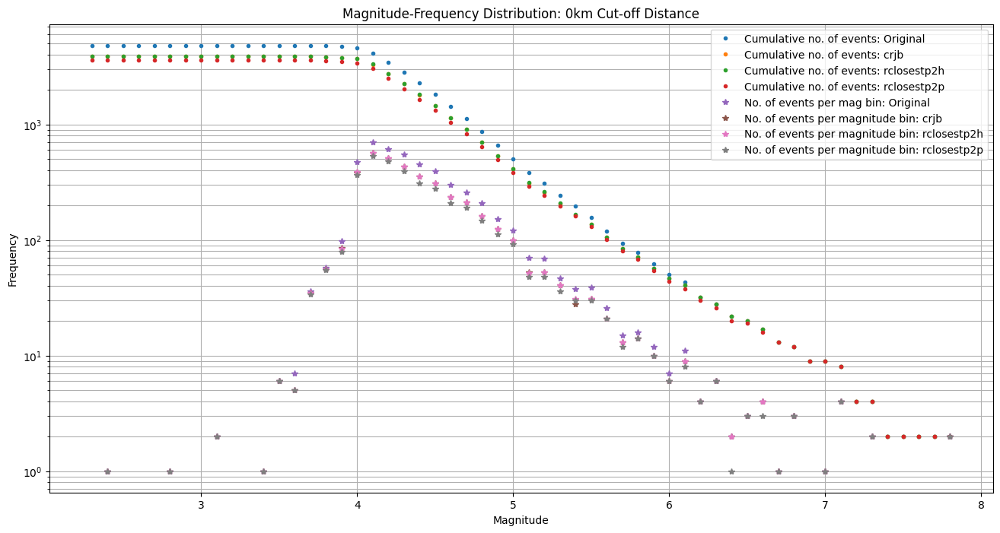

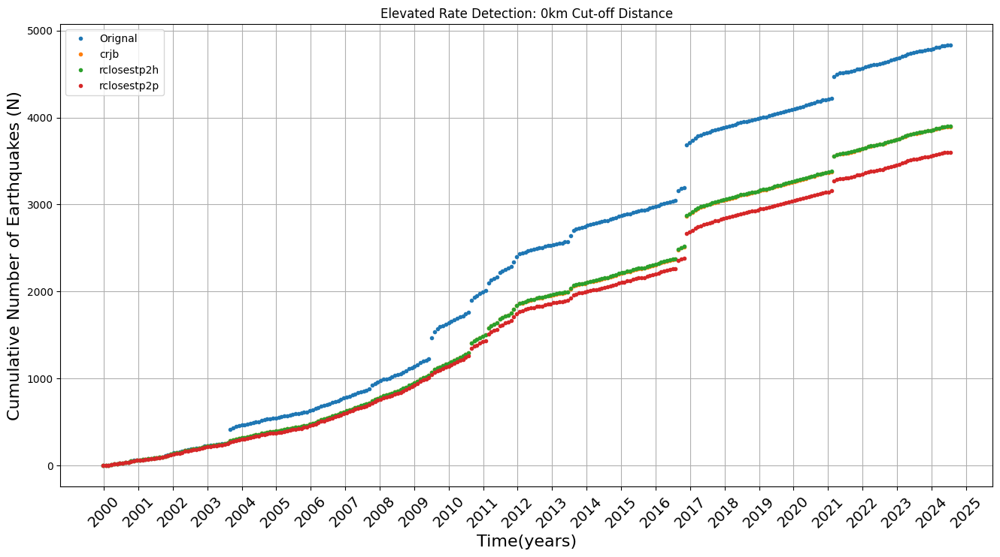

In [14]:
decimal_year = decimalyear(catalogue_pd)
decimal_yearnp = np.array(decimal_year)

decimal_year_crjb0 = decimalyear(catalogue_dec_crjb0)
decimal_yearnp_crjb0 = np.array(decimal_year_crjb0)

decimal_year_rclosestp2h0 = decimalyear(catalogue_dec_rclosestp2h0)
decimal_yearnp_rclosestp2h0 = np.array(decimal_year_rclosestp2h0)

decimal_year_rclosestp2p0 = decimalyear(catalogue_dec_rclosestp2p0)
decimal_yearnp_rclosestp2p0 = np.array(decimal_year_rclosestp2p0)

cat_mi, cat_nbmag, cat_cumnbmag = fmd(mag = catalogue_pd.mag, mbin = 0.1)
cat_mi_crjb0, cat_nbmag_crjb0, cat_cumnbmag_crjb0 = fmd(mag = catalogue_dec_crjb0.mag, mbin = 0.1)
cat_mi_rclosestp2h0, cat_nbmag_rclosestp2h0, cat_cumnbmag_rclosestp2h0 = fmd(mag = catalogue_dec_rclosestp2h0.mag, mbin = 0.1)
cat_mi_rclosestp2p0, cat_nbmag_rclosestp2p0, cat_cumnbmag_rclosestp2p0 = fmd(mag = catalogue_dec_rclosestp2p0.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti,nbt, cumnbt = ftd(decimal_yearnp,ntbin)
ti_crjb0,nbt_crjb0, cumnbt_crjb0 = ftd(decimal_yearnp_crjb0,ntbin)
ti_rclosestp2h0,nbt_rclosestp2h0, cumnbt_rclosestp2h0 = ftd(decimal_yearnp_rclosestp2h0,ntbin)
ti_rclosestp2p0,nbt_rclosestp2p0, cumnbt_rclosestp2p0 = ftd(decimal_yearnp_rclosestp2p0,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb0, cat_cumnbmag_crjb0, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h0, cat_cumnbmag_rclosestp2h0, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p0, cat_cumnbmag_rclosestp2p0, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb0, cat_nbmag_crjb0, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h0, cat_nbmag_rclosestp2h0, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p0, cat_nbmag_rclosestp2p0, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 0km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb0, cumnbt_crjb0, ".",label = 'crjb')
plt.plot(ti_rclosestp2h0, cumnbt_rclosestp2h0, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p0, cumnbt_rclosestp2p0, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 0km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.2 Cut-off Distance: 2km

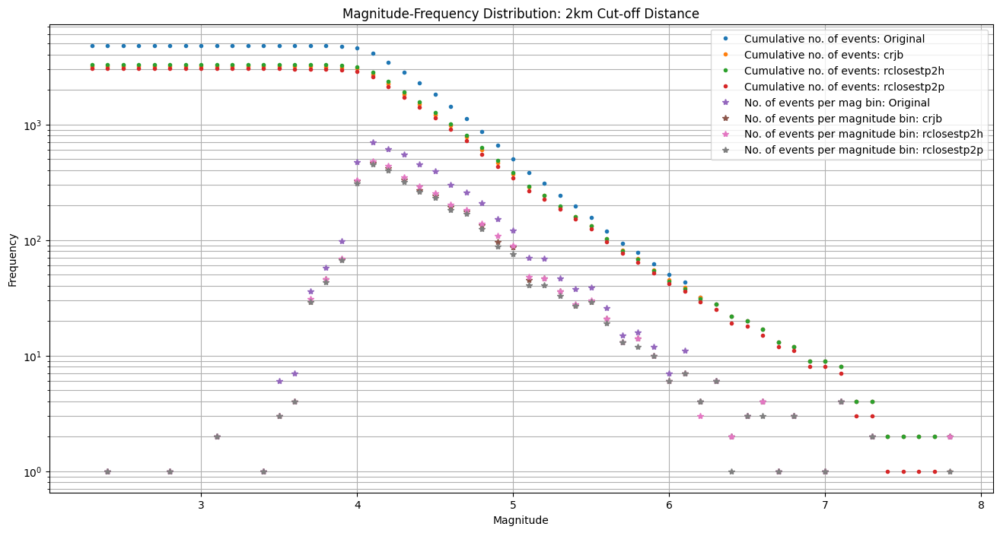

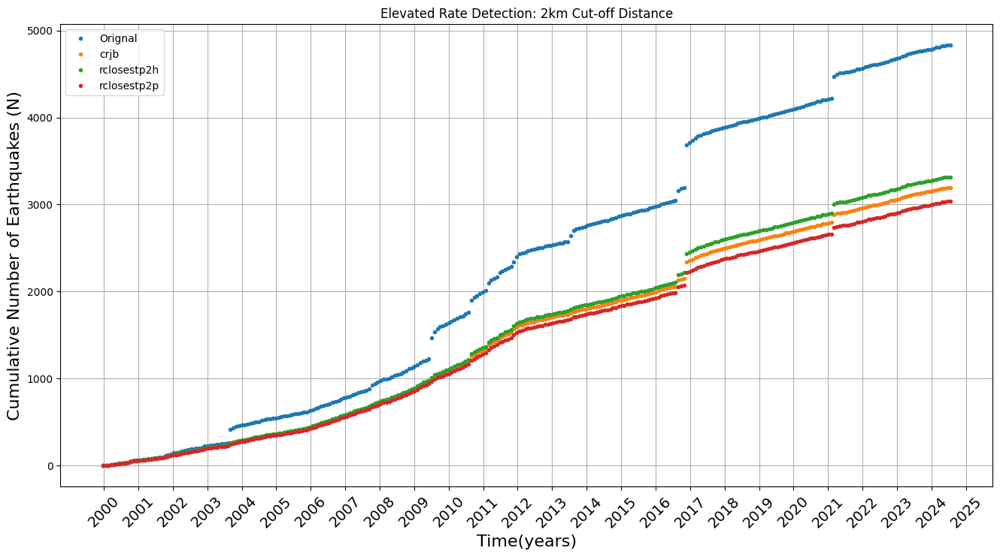

In [15]:
decimal_year = decimalyear(catalogue_pd)
decimal_yearnp = np.array(decimal_year)

decimal_year_crjb2 = decimalyear(catalogue_dec_crjb2)
decimal_yearnp_crjb2 = np.array(decimal_year_crjb2)

decimal_year_rclosestp2h2 = decimalyear(catalogue_dec_rclosestp2h2)
decimal_yearnp_rclosestp2h2 = np.array(decimal_year_rclosestp2h2)

decimal_year_rclosestp2p2 = decimalyear(catalogue_dec_rclosestp2p2)
decimal_yearnp_rclosestp2p2 = np.array(decimal_year_rclosestp2p2)

cat_mi, cat_nbmag, cat_cumnbmag = fmd(mag = catalogue_pd.mag, mbin = 0.1)
cat_mi_crjb2, cat_nbmag_crjb2, cat_cumnbmag_crjb2 = fmd(mag = catalogue_dec_crjb2.mag, mbin = 0.1)
cat_mi_rclosestp2h2, cat_nbmag_rclosestp2h2, cat_cumnbmag_rclosestp2h2 = fmd(mag = catalogue_dec_rclosestp2h2.mag, mbin = 0.1)
cat_mi_rclosestp2p2, cat_nbmag_rclosestp2p2, cat_cumnbmag_rclosestp2p2 = fmd(mag = catalogue_dec_rclosestp2p2.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti,nbt, cumnbt = ftd(decimal_yearnp,ntbin)
ti_crjb2,nbt_crjb2, cumnbt_crjb2 = ftd(decimal_yearnp_crjb2,ntbin)
ti_rclosestp2h2,nbt_rclosestp2h2, cumnbt_rclosestp2h2 = ftd(decimal_yearnp_rclosestp2h2,ntbin)
ti_rclosestp2p2,nbt_rclosestp2p2, cumnbt_rclosestp2p2 = ftd(decimal_yearnp_rclosestp2p2,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb2, cat_cumnbmag_crjb2, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h2, cat_cumnbmag_rclosestp2h2, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p2, cat_cumnbmag_rclosestp2p2, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb2, cat_nbmag_crjb2, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h2, cat_nbmag_rclosestp2h2, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p2, cat_nbmag_rclosestp2p2, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 2km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb2, cumnbt_crjb2, ".",label = 'crjb')
plt.plot(ti_rclosestp2h2, cumnbt_rclosestp2h2, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p2, cumnbt_rclosestp2p2, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 2km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.3 Cut-off Distance: 5km

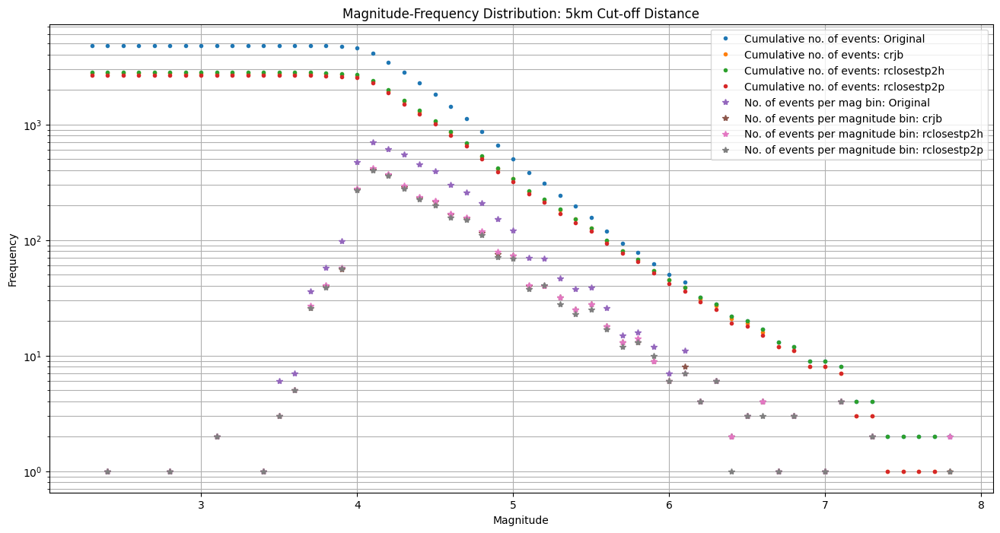

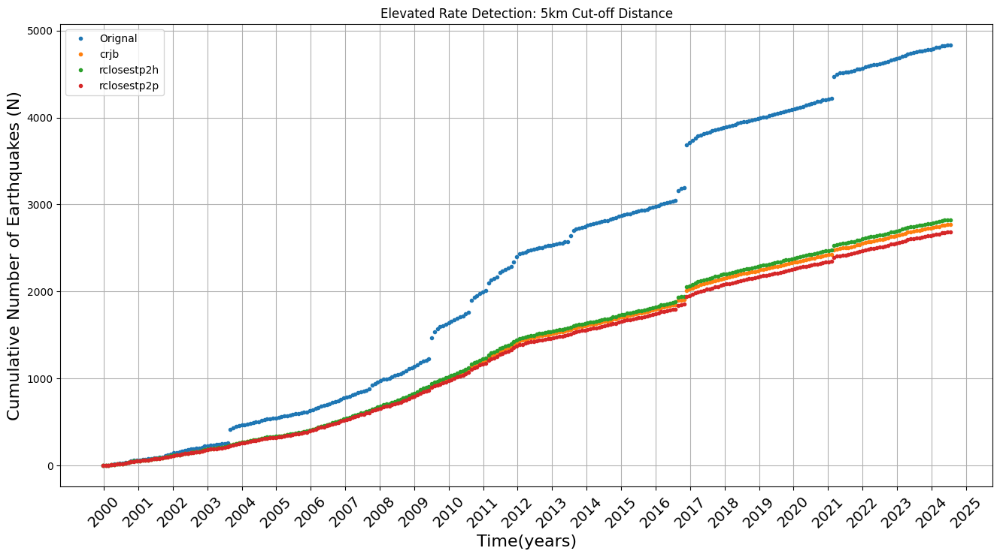

In [16]:
decimal_year_crjb5 = decimalyear(catalogue_dec_crjb5)
decimal_yearnp_crjb5 = np.array(decimal_year_crjb5)

decimal_year_rclosestp2h5 = decimalyear(catalogue_dec_rclosestp2h5)
decimal_yearnp_rclosestp2h5 = np.array(decimal_year_rclosestp2h5)

decimal_year_rclosestp2p5 = decimalyear(catalogue_dec_rclosestp2p5)
decimal_yearnp_rclosestp2p5 = np.array(decimal_year_rclosestp2p5)

cat_mi_crjb5, cat_nbmag_crjb5, cat_cumnbmag_crjb5 = fmd(mag = catalogue_dec_crjb5.mag, mbin = 0.1)
cat_mi_rclosestp2h5, cat_nbmag_rclosestp2h5, cat_cumnbmag_rclosestp2h5 = fmd(mag = catalogue_dec_rclosestp2h5.mag, mbin = 0.1)
cat_mi_rclosestp2p5, cat_nbmag_rclosestp2p5, cat_cumnbmag_rclosestp2p5 = fmd(mag = catalogue_dec_rclosestp2p5.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.

ti_crjb5,nbt_crjb5, cumnbt_crjb5 = ftd(decimal_yearnp_crjb5,ntbin)
ti_rclosestp2h5,nbt_rclosestp2h5, cumnbt_rclosestp2h5 = ftd(decimal_yearnp_rclosestp2h5,ntbin)
ti_rclosestp2p5,nbt_rclosestp2p5, cumnbt_rclosestp2p5 = ftd(decimal_yearnp_rclosestp2p5,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb5, cat_cumnbmag_crjb5, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h5, cat_cumnbmag_rclosestp2h5, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p5, cat_cumnbmag_rclosestp2p5, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb5, cat_nbmag_crjb5, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h5, cat_nbmag_rclosestp2h5, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p5, cat_nbmag_rclosestp2p5, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 5km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb5, cumnbt_crjb5, ".",label = 'crjb')
plt.plot(ti_rclosestp2h5, cumnbt_rclosestp2h5, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p5, cumnbt_rclosestp2p5, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 5km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.4 Cut-off Distance: 10km

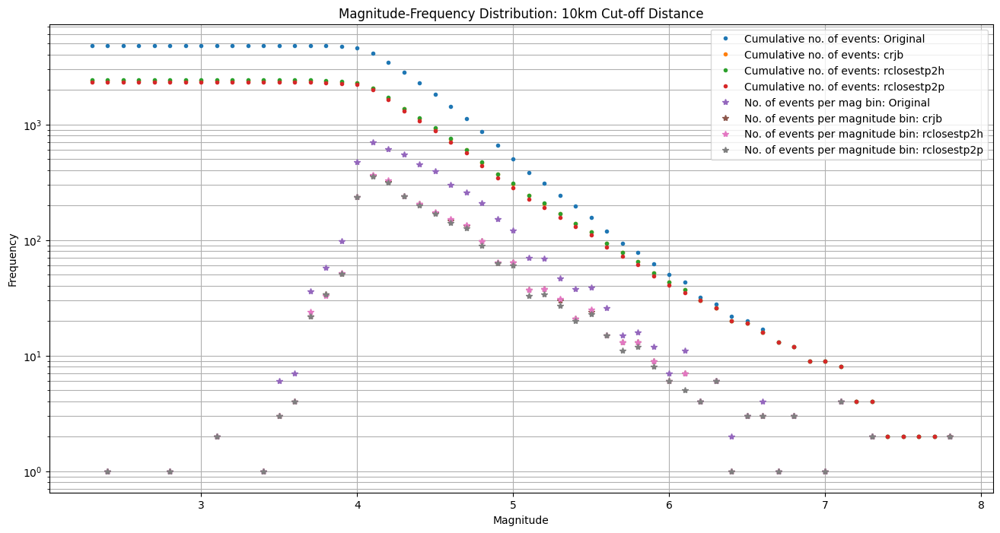

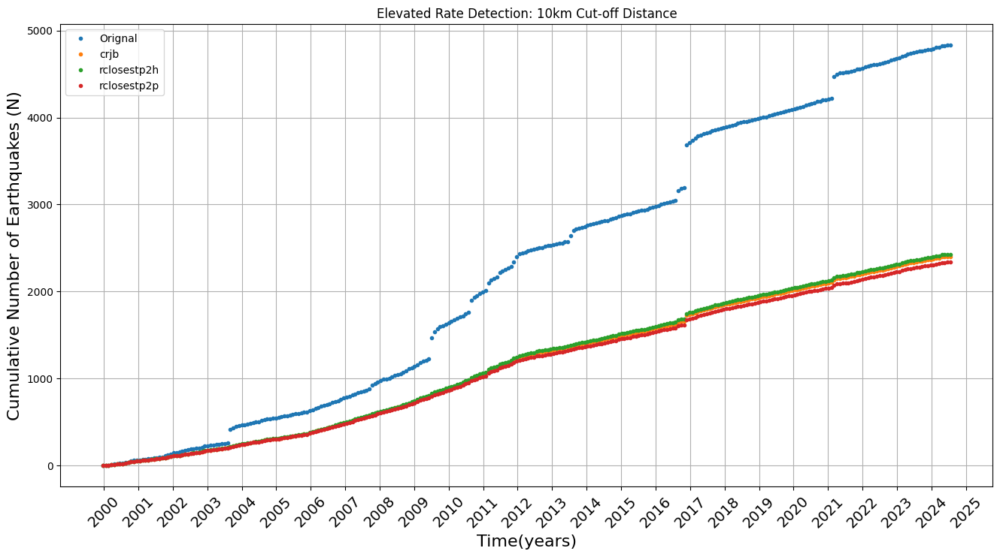

In [17]:
decimal_year_crjb10 = decimalyear(catalogue_dec_crjb10)
decimal_yearnp_crjb10 = np.array(decimal_year_crjb10)

decimal_year_rclosestp2h10 = decimalyear(catalogue_dec_rclosestp2h10)
decimal_yearnp_rclosestp2h10 = np.array(decimal_year_rclosestp2h10)

decimal_year_rclosestp2p10 = decimalyear(catalogue_dec_rclosestp2p10)
decimal_yearnp_rclosestp2p10 = np.array(decimal_year_rclosestp2p10)

cat_mi_crjb10, cat_nbmag_crjb10, cat_cumnbmag_crjb10 = fmd(mag = catalogue_dec_crjb10.mag, mbin = 0.1)
cat_mi_rclosestp2h10, cat_nbmag_rclosestp2h10, cat_cumnbmag_rclosestp2h10 = fmd(mag = catalogue_dec_rclosestp2h10.mag, mbin = 0.1)
cat_mi_rclosestp2p10, cat_nbmag_rclosestp2p10, cat_cumnbmag_rclosestp2p10 = fmd(mag = catalogue_dec_rclosestp2p10.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti_crjb10,nbt_crjb10, cumnbt_crjb10 = ftd(decimal_yearnp_crjb10,ntbin)
ti_rclosestp2h10,nbt_rclosestp2h10, cumnbt_rclosestp2h10 = ftd(decimal_yearnp_rclosestp2h10,ntbin)
ti_rclosestp2p10,nbt_rclosestp2p10, cumnbt_rclosestp2p10 = ftd(decimal_yearnp_rclosestp2p10,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb10, cat_cumnbmag_crjb10, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h10, cat_cumnbmag_rclosestp2h10, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p10, cat_cumnbmag_rclosestp2p10, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb10, cat_nbmag_crjb10, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h10, cat_nbmag_rclosestp2h10, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p10, cat_nbmag_rclosestp2p10, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 10km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb10, cumnbt_crjb10, ".",label = 'crjb')
plt.plot(ti_rclosestp2h10, cumnbt_rclosestp2h10, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p10, cumnbt_rclosestp2p10, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 10km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.5 Cut-off Distance: 20km

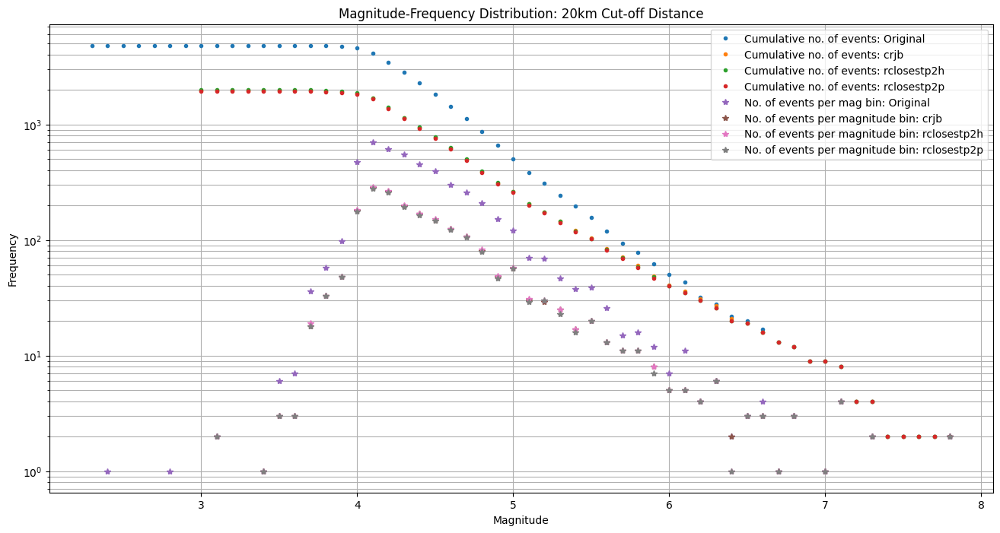

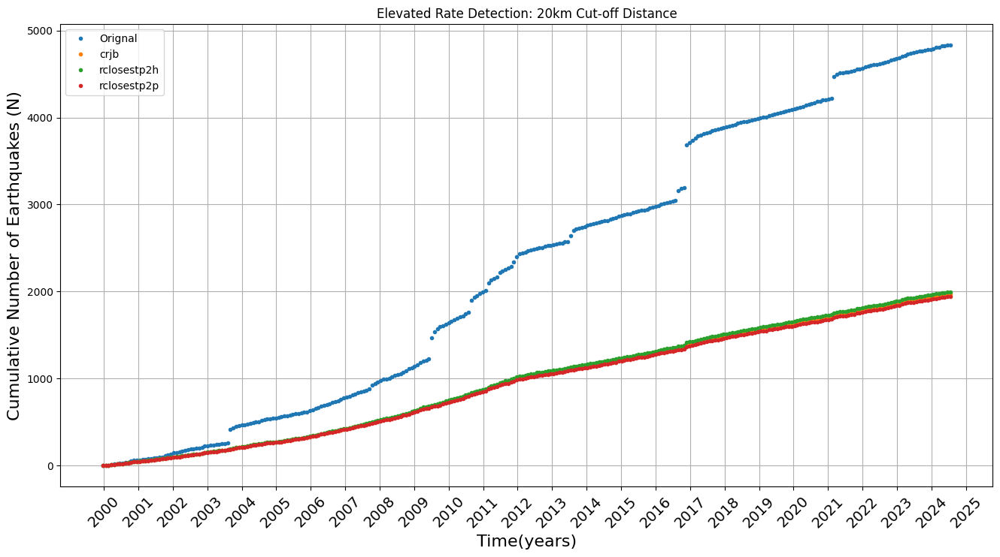

In [18]:
decimal_year_crjb20 = decimalyear(catalogue_dec_crjb20)
decimal_yearnp_crjb20 = np.array(decimal_year_crjb20)

decimal_year_rclosestp2h20 = decimalyear(catalogue_dec_rclosestp2h20)
decimal_yearnp_rclosestp2h20 = np.array(decimal_year_rclosestp2h20)

decimal_year_rclosestp2p20 = decimalyear(catalogue_dec_rclosestp2p20)
decimal_yearnp_rclosestp2p20 = np.array(decimal_year_rclosestp2p20)

cat_mi_crjb20, cat_nbmag_crjb20, cat_cumnbmag_crjb20 = fmd(mag = catalogue_dec_crjb20.mag, mbin = 0.1)
cat_mi_rclosestp2h20, cat_nbmag_rclosestp2h20, cat_cumnbmag_rclosestp2h20 = fmd(mag = catalogue_dec_rclosestp2h20.mag, mbin = 0.1)
cat_mi_rclosestp2p20, cat_nbmag_rclosestp2p20, cat_cumnbmag_rclosestp2p20 = fmd(mag = catalogue_dec_rclosestp2p20.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti_crjb20,nbt_crjb20, cumnbt_crjb20 = ftd(decimal_yearnp_crjb20,ntbin)
ti_rclosestp2h20,nbt_rclosestp2h20, cumnbt_rclosestp2h20 = ftd(decimal_yearnp_rclosestp2h20,ntbin)
ti_rclosestp2p20,nbt_rclosestp2p20, cumnbt_rclosestp2p20 = ftd(decimal_yearnp_rclosestp2p20,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb20, cat_cumnbmag_crjb20, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h20, cat_cumnbmag_rclosestp2h20, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p20, cat_cumnbmag_rclosestp2p20, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb20, cat_nbmag_crjb20, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h20, cat_nbmag_rclosestp2h20, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p20, cat_nbmag_rclosestp2p20, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 20km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb20, cumnbt_crjb20, ".",label = 'crjb')
plt.plot(ti_rclosestp2h20, cumnbt_rclosestp2h20, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p20, cumnbt_rclosestp2p20, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 20km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.6 Cut-off Distance: 30km

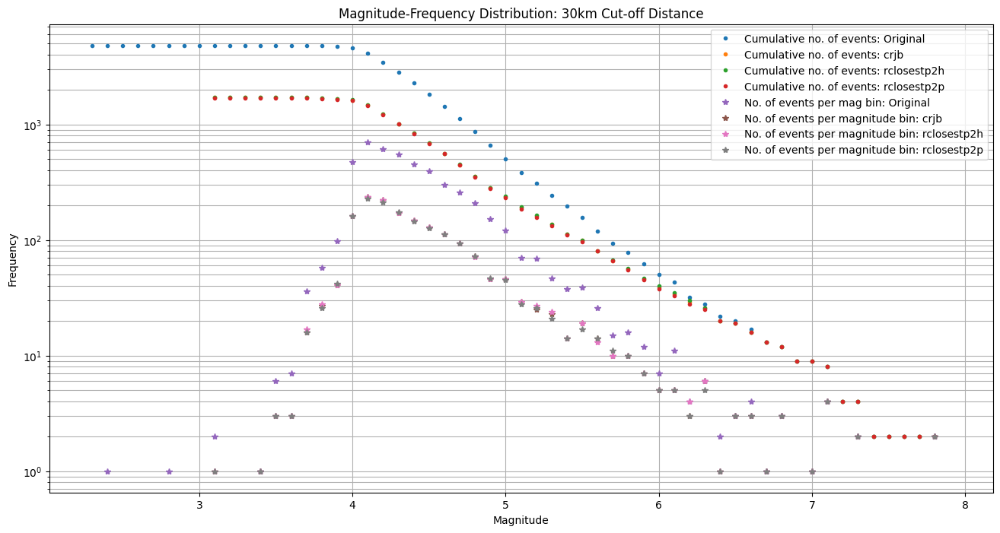

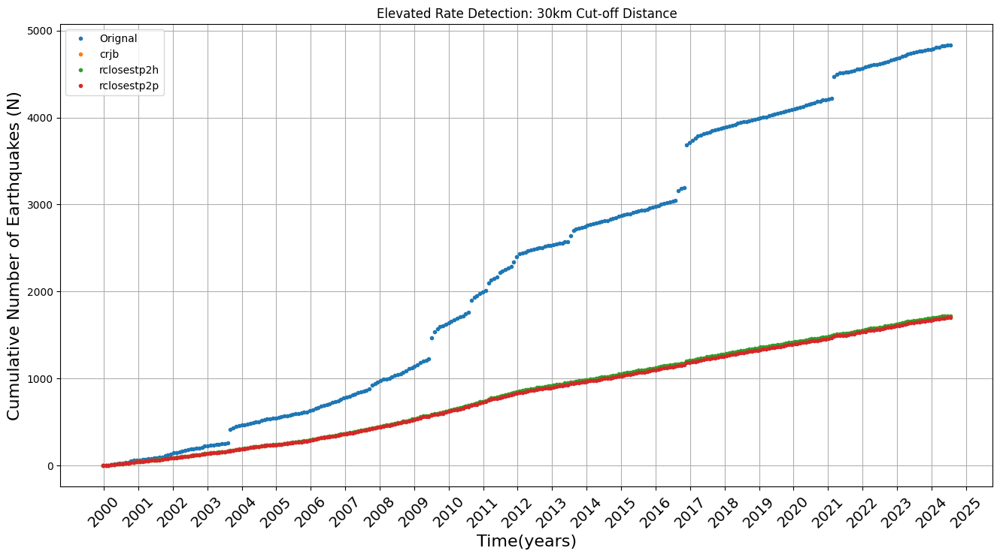

In [19]:
decimal_year_crjb30 = decimalyear(catalogue_dec_crjb30)
decimal_yearnp_crjb30 = np.array(decimal_year_crjb30)

decimal_year_rclosestp2h30 = decimalyear(catalogue_dec_rclosestp2h30)
decimal_yearnp_rclosestp2h30 = np.array(decimal_year_rclosestp2h30)

decimal_year_rclosestp2p30 = decimalyear(catalogue_dec_rclosestp2p30)
decimal_yearnp_rclosestp2p30 = np.array(decimal_year_rclosestp2p30)

cat_mi_crjb30, cat_nbmag_crjb30, cat_cumnbmag_crjb30 = fmd(mag = catalogue_dec_crjb30.mag, mbin = 0.1)
cat_mi_rclosestp2h30, cat_nbmag_rclosestp2h30, cat_cumnbmag_rclosestp2h30 = fmd(mag = catalogue_dec_rclosestp2h30.mag, mbin = 0.1)
cat_mi_rclosestp2p30, cat_nbmag_rclosestp2p30, cat_cumnbmag_rclosestp2p30 = fmd(mag = catalogue_dec_rclosestp2p30.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti_crjb30,nbt_crjb30, cumnbt_crjb30 = ftd(decimal_yearnp_crjb30,ntbin)
ti_rclosestp2h30,nbt_rclosestp2h30, cumnbt_rclosestp2h30 = ftd(decimal_yearnp_rclosestp2h30,ntbin)
ti_rclosestp2p30,nbt_rclosestp2p30, cumnbt_rclosestp2p30 = ftd(decimal_yearnp_rclosestp2p30,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb30, cat_cumnbmag_crjb30, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h30, cat_cumnbmag_rclosestp2h30, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p30, cat_cumnbmag_rclosestp2p30, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb30, cat_nbmag_crjb30, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h30, cat_nbmag_rclosestp2h30, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p30, cat_nbmag_rclosestp2p30, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 30km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb30, cumnbt_crjb30, ".",label = 'crjb')
plt.plot(ti_rclosestp2h30, cumnbt_rclosestp2h30, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p30, cumnbt_rclosestp2p30, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 30km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

## 4.7 Cut-off Distance: 40km

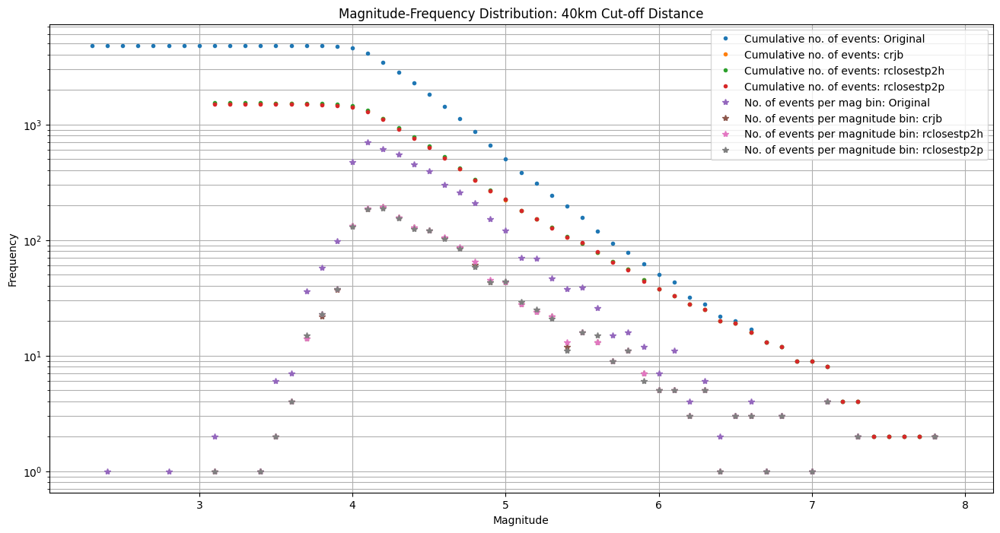

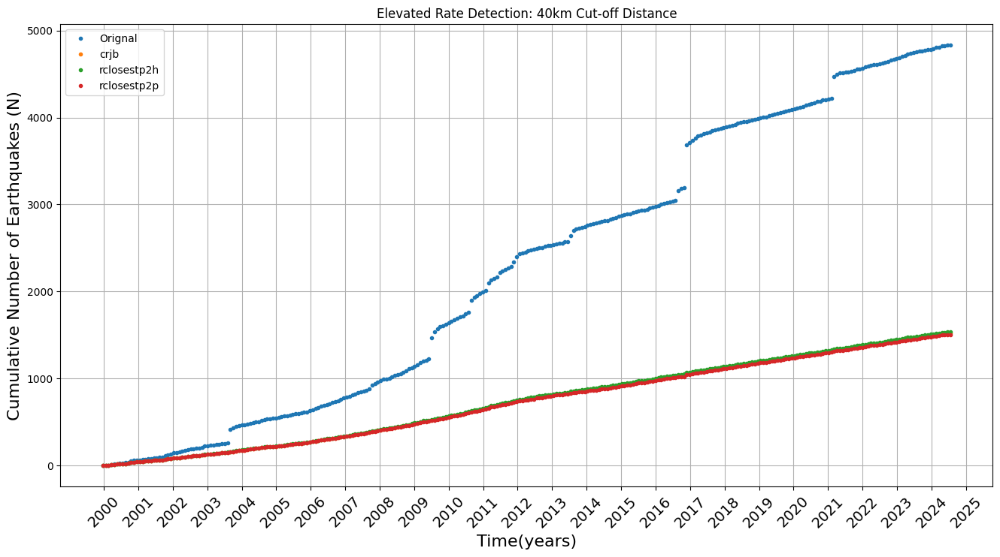

In [20]:
decimal_year_crjb40 = decimalyear(catalogue_dec_crjb40)
decimal_yearnp_crjb40 = np.array(decimal_year_crjb40)

decimal_year_rclosestp2h40 = decimalyear(catalogue_dec_rclosestp2h40)
decimal_yearnp_rclosestp2h40 = np.array(decimal_year_rclosestp2h40)

decimal_year_rclosestp2p40 = decimalyear(catalogue_dec_rclosestp2p40)
decimal_yearnp_rclosestp2p40 = np.array(decimal_year_rclosestp2p40)

cat_mi_crjb40, cat_nbmag_crjb40, cat_cumnbmag_crjb40 = fmd(mag = catalogue_dec_crjb40.mag, mbin = 0.1)
cat_mi_rclosestp2h40, cat_nbmag_rclosestp2h40, cat_cumnbmag_rclosestp2h40 = fmd(mag = catalogue_dec_rclosestp2h40.mag, mbin = 0.1)
cat_mi_rclosestp2p40, cat_nbmag_rclosestp2p40, cat_cumnbmag_rclosestp2p40 = fmd(mag = catalogue_dec_rclosestp2p40.mag, mbin = 0.1)

year_bins = np.arange(2000., 2026., 1)
ntbin = 30./365.
ti_crjb40,nbt_crjb40, cumnbt_crjb40 = ftd(decimal_yearnp_crjb40,ntbin)
ti_rclosestp2h40,nbt_rclosestp2h40, cumnbt_rclosestp2h40 = ftd(decimal_yearnp_rclosestp2h40,ntbin)
ti_rclosestp2p40,nbt_rclosestp2p40, cumnbt_rclosestp2p40 = ftd(decimal_yearnp_rclosestp2p40,ntbin)

plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi_crjb40, cat_cumnbmag_crjb40, '.', label="Cumulative no. of events: crjb")
plt.plot(cat_mi_rclosestp2h40, cat_cumnbmag_rclosestp2h40, '.', label="Cumulative no. of events: rclosestp2h")
plt.plot(cat_mi_rclosestp2p40, cat_cumnbmag_rclosestp2p40, '.', label="Cumulative no. of events: rclosestp2p")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.plot(cat_mi_crjb40, cat_nbmag_crjb40, '*', label="No. of events per magnitude bin: crjb")
plt.plot(cat_mi_rclosestp2h40, cat_nbmag_rclosestp2h40, '*', label="No. of events per magnitude bin: rclosestp2h")
plt.plot(cat_mi_rclosestp2p40, cat_nbmag_rclosestp2p40, '*', label="No. of events per magnitude bin: rclosestp2p")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: 40km Cut-off Distance')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.plot(ti_crjb40, cumnbt_crjb40, ".",label = 'crjb')
plt.plot(ti_rclosestp2h40, cumnbt_rclosestp2h40, ".",label = 'rclosestp2h')
plt.plot(ti_rclosestp2p40, cumnbt_rclosestp2p40, ".",label = 'rclosestp2p')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: 40km Cut-off Distance')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

# 5.0 Original Catalog: FMD & ERD

## 5.1 FMD Plot

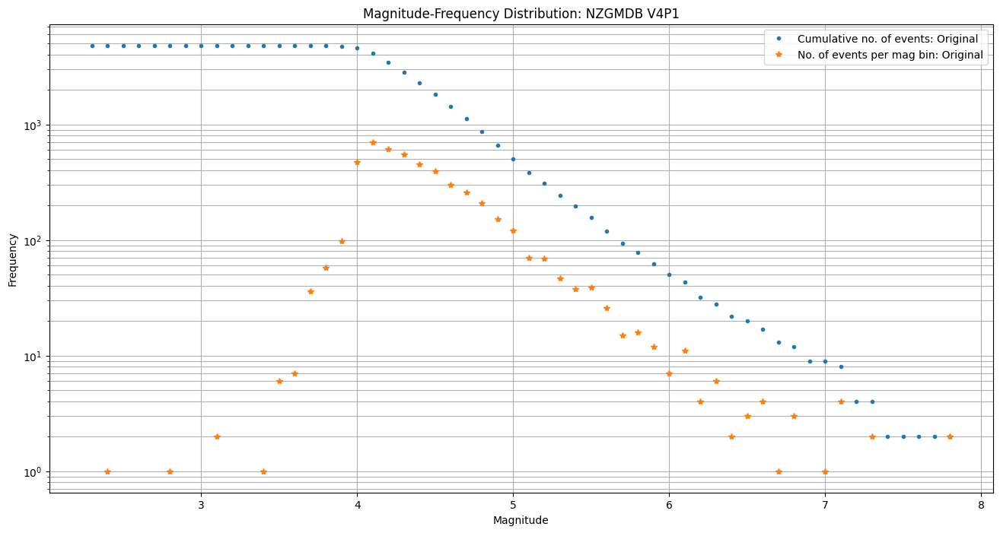

In [21]:
plt.figure(figsize=(16, 8))
plt.plot(cat_mi, cat_cumnbmag, '.', label="Cumulative no. of events: Original")
plt.plot(cat_mi, cat_nbmag, '*', label="No. of events per mag bin: Original")
plt.yscale('log')
plt.xlabel('Magnitude')
plt.ylabel('Frequency')
plt.title('Magnitude-Frequency Distribution: NZGMDB V4P1')
plt.legend(loc="upper right")
plt.grid(which="both")
plt.show()

## 5.2 ERD Plot

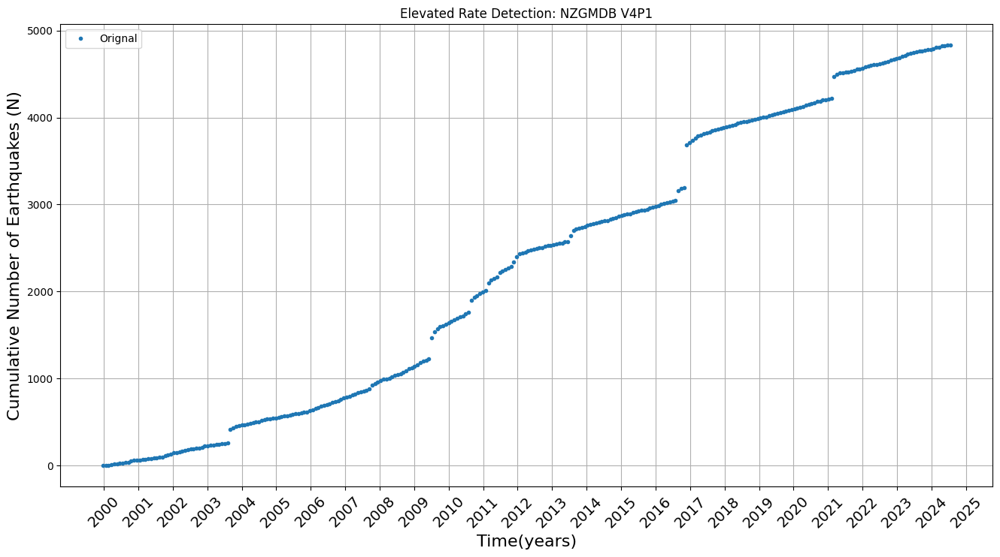

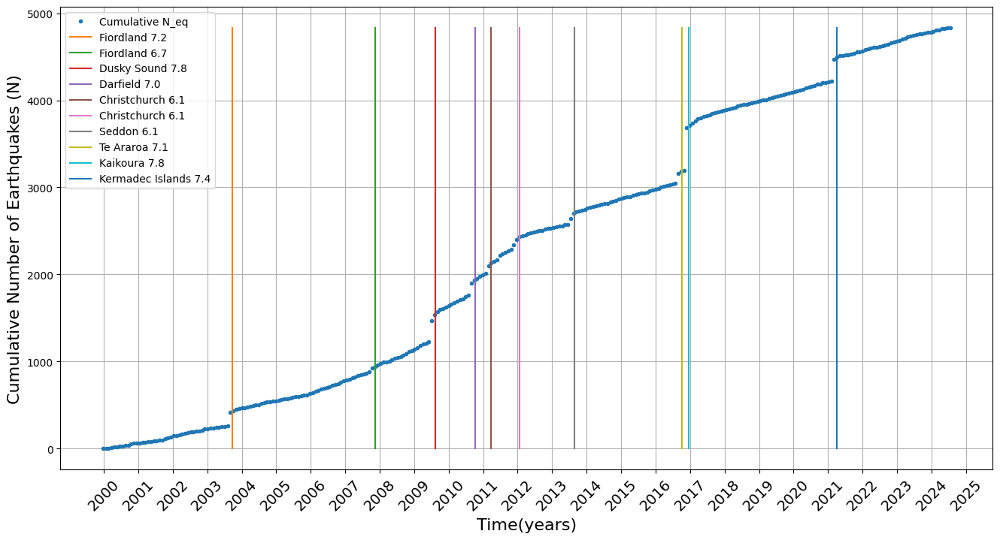

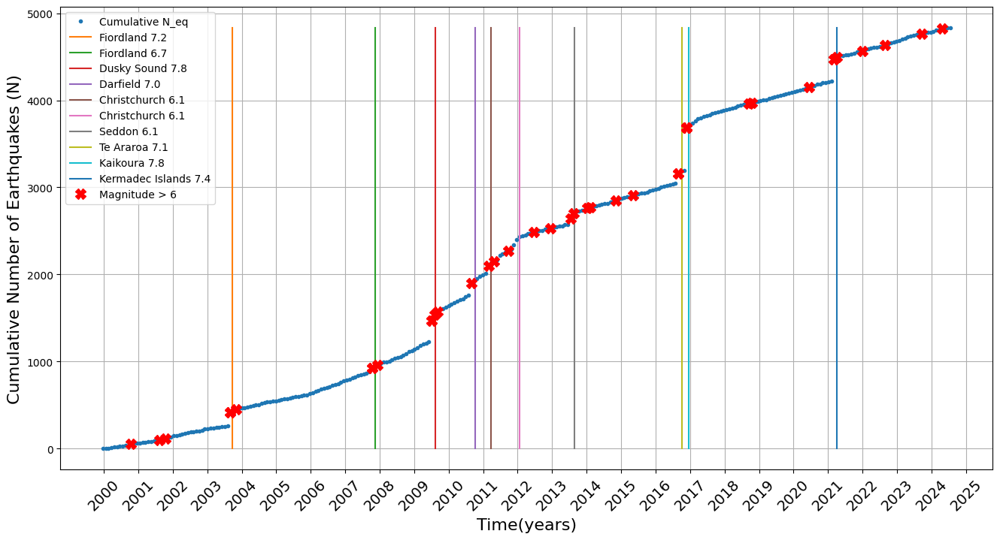

In [22]:
plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".",label = 'Orignal')
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.title('Elevated Rate Detection: NZGMDB V4P1')
plt.grid(which="both")
plt.legend(loc="upper left")
plt.show()

meq_time = np.array(
    [[2003, 8, 22], [2007, 10, 16], [2009, 7, 15], [2010, 9, 4], [2011, 2, 22], [2011, 12, 23], [2013, 7, 21],
     [2016, 9, 2], [2016, 11, 14], [2021, 3, 5]])
meq_mag = np.array(([7.2], [6.7], [7.8], [7], [6.1], [6.1], [6.1], [7.1], [7.8], [8]))

year_dec_meq = meq_time[:, 0]+meq_time[:, 1]/12 + meq_time[:, 2]/366

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".")
plt.plot([year_dec_meq,year_dec_meq], [0, len(catalogue_pd)], "-")
plt.xticks(year_bins.tolist(), fontsize=14,rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.legend(['Cumulative N_eq','Fiordland 7.2','Fiordland 6.7','Dusky Sound 7.8','Darfield 7.0','Christchurch 6.1','Christchurch 6.1','Seddon 6.1','Te Araroa 7.1','Kaikoura 7.8','Kermadec Islands 7.4'],loc="upper left")
plt.grid(which="both")
plt.show()

index_65 = catalogue_pd[catalogue_pd.mag > 6].index
index_65_1 = []
for i in range(len(index_65)):
    index = np.abs(ti - np.array(decimal_yearnp[index_65[i]])).argmin()
    index_65_1.append(index)

plt.figure(figsize=(16, 8))
plt.plot(ti, cumnbt, ".")
plt.plot([year_dec_meq, year_dec_meq], [0, len(catalogue_pd)], "-")
plt.plot(ti[index_65_1], cumnbt[index_65_1], "Xr", markersize=10)
plt.xticks(year_bins.tolist(), fontsize=14, rotation=45)
plt.ylabel('Cumulative Number of Earthquakes (N)', fontsize=16)
plt.xlabel('Time(years)', fontsize=16)
plt.legend(['Cumulative N_eq', 'Fiordland 7.2', 'Fiordland 6.7', 'Dusky Sound 7.8', 'Darfield 7.0', 'Christchurch 6.1',
            'Christchurch 6.1', 'Seddon 6.1', 'Te Araroa 7.1', 'Kaikoura 7.8', 'Kermadec Islands 7.4',
            'Magnitude > 6'], loc="upper left")
plt.grid(which="both")
plt.show()

# 6.0 Spatial Plots of Results

Based on the FMD and ERD Plots the Cut-off Distances 5, 10, 20 and 30km seemed to give the best results and thus only these will be mapped for further interrogation. Furthermore, it appears with increasing distances the quantity of Class 1 events being to plateau as evidenced between cut-off distances between 30 - 40km.

## 6.1 Map Plot of All Earthquakes

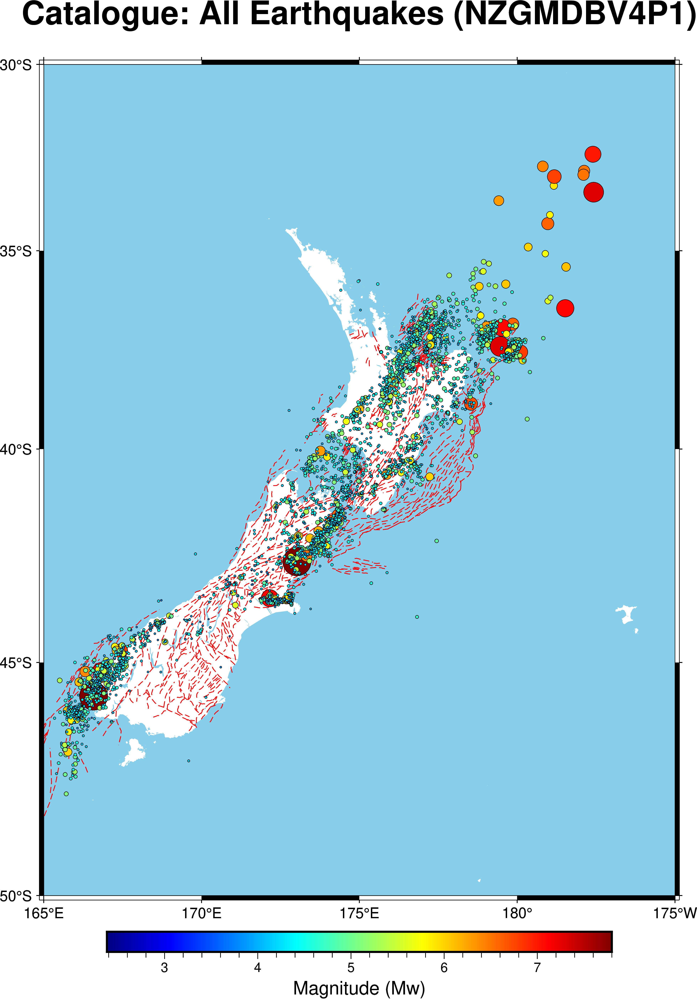

In [23]:
fault_file = Path(r'C:\Users\LEGION\OneDrive - University of Canterbury\Python_V1\NZ_CFM_v1_0_Tsurf\NZ_CFM_v1_0_WGS84.shp')
fault_file_gdf = gpd.read_file(fault_file)
linestrings = [geom for geom in fault_file_gdf.geometry]

import pygmt
region = [165,185,-50,-30]
# grid = pygmt.datasets.load_earth_relief(resolution="05m", region=region)
# region = 'NZ'

fig = pygmt.Figure()
# fig.grdimage(grid=grid, projection="M15c", frame="a", cmap="geo")
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_pd.lon,
    y=catalogue_pd.lat,
    size=0.003*2**catalogue_pd.mag,
    fill=catalogue_pd.mag,
    cmap=True,
    style="cc",
    pen="black",
)
# fig.plot(x=catalogue_pd.longitude, y=catalogue_pd.latitude, style="c0.3c", fill="white", pen="black")
fig.basemap(frame=["a", "+tCatalogue: All Earthquakes (NZGMDBV4P1)"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method = 'notebook',dpi=600,width=720)

## 6.2 Cut-off Distance: 5km

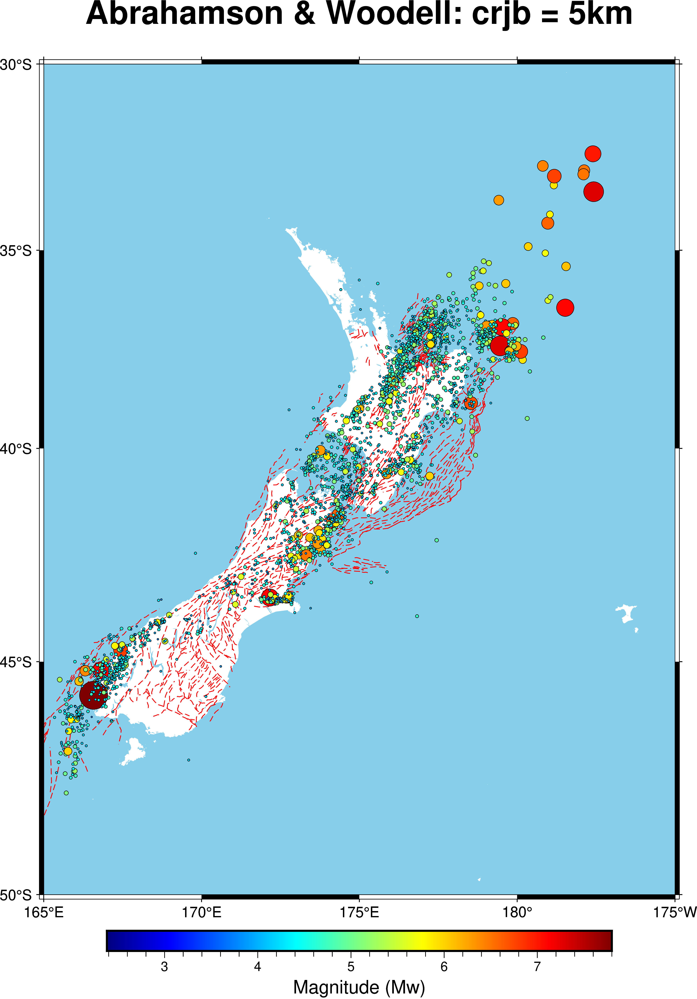

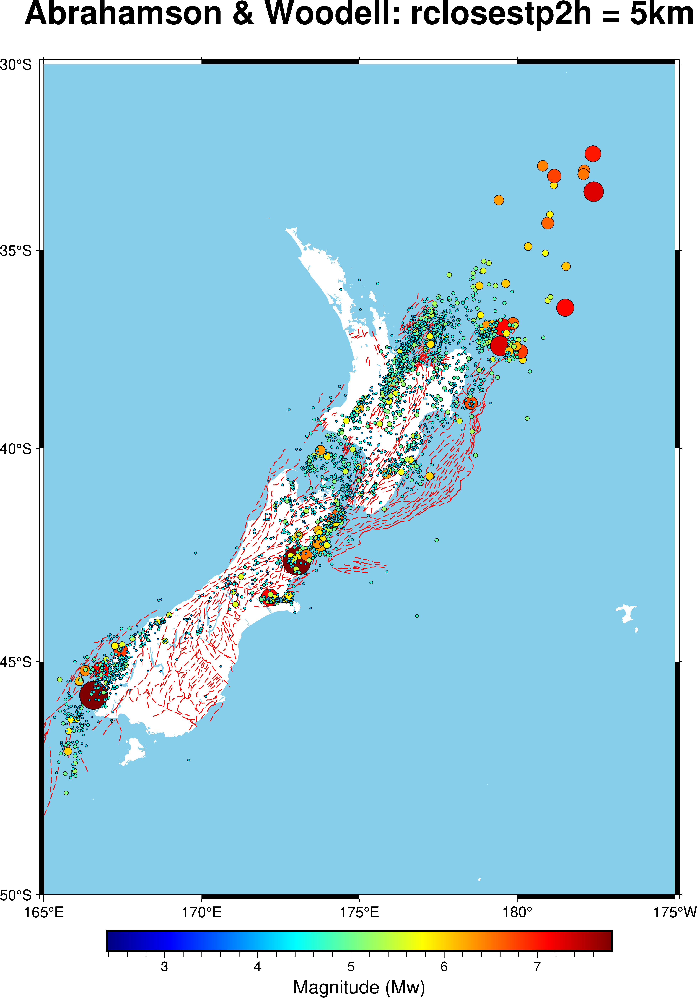

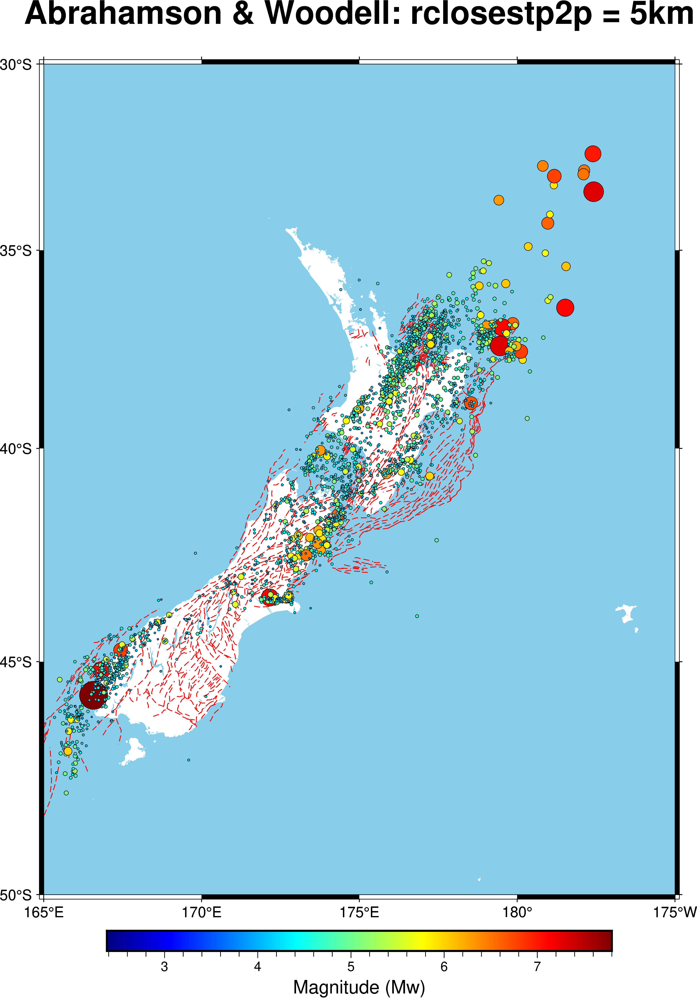

In [24]:
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_crjb5.lon,
    y=catalogue_dec_crjb5.lat,
    size=0.003*2**catalogue_dec_crjb5.mag,
    fill=catalogue_dec_crjb5.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: crjb = 5km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method = 'notebook',dpi=600,width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2h5.lon,
    y=catalogue_dec_rclosestp2h5.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2h5.mag,
    fill=catalogue_dec_rclosestp2h5.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2h = 5km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2p5.lon,
    y=catalogue_dec_rclosestp2p5.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2p5.mag,
    fill=catalogue_dec_rclosestp2p5.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2p = 5km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

## 6.3 Cut-off Distance: 10km

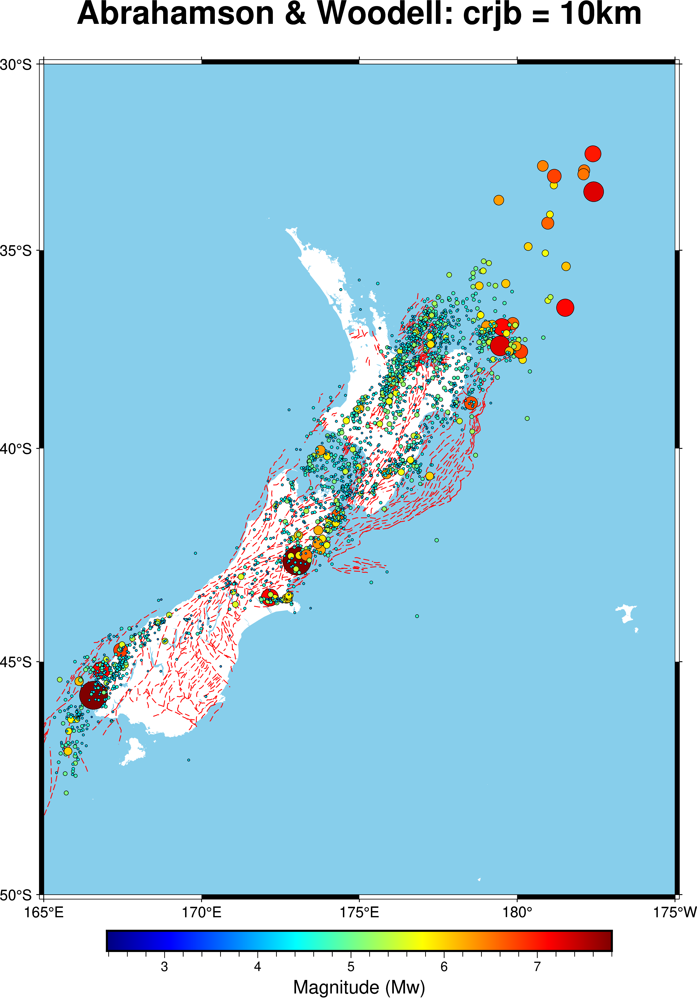

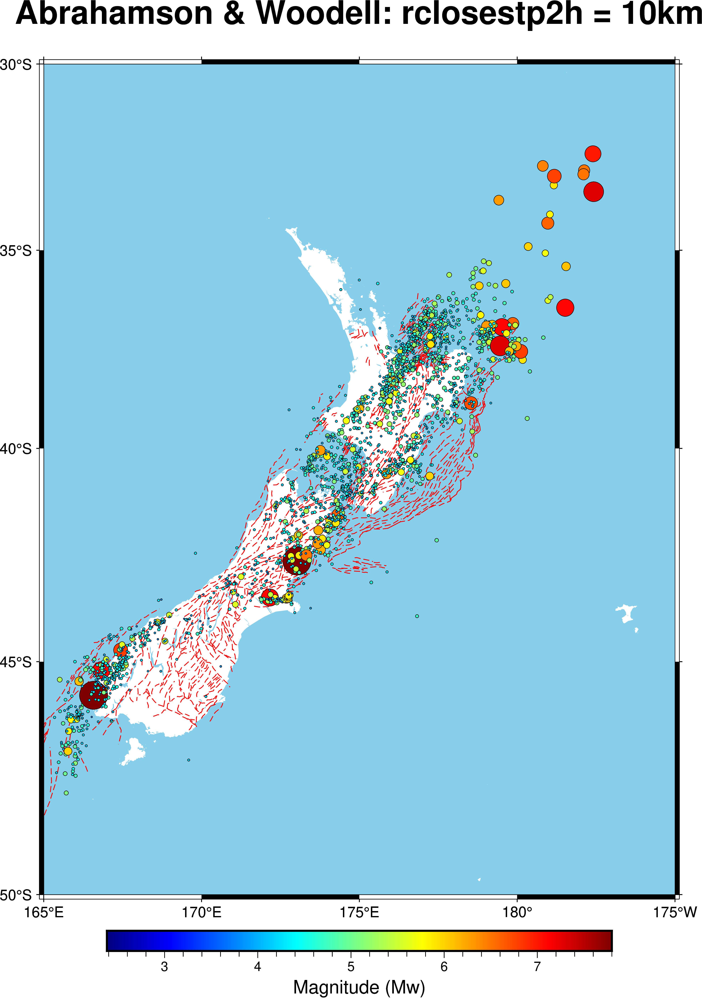

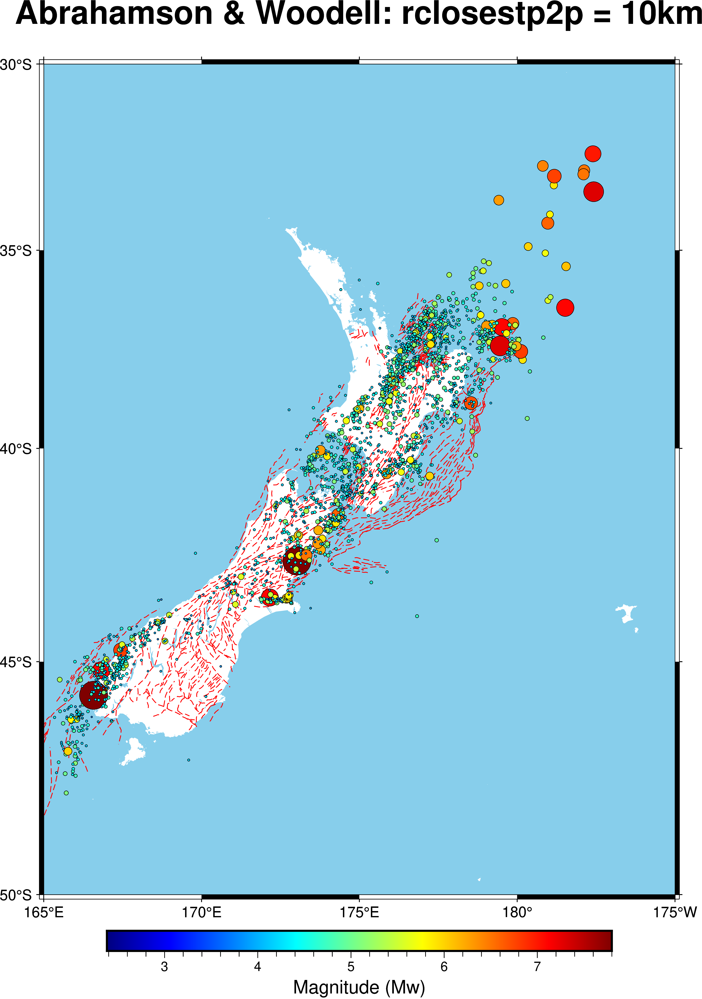

In [25]:
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_crjb10.lon,
    y=catalogue_dec_crjb10.lat,
    size=0.003*2**catalogue_dec_crjb10.mag,
    fill=catalogue_dec_crjb10.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: crjb = 10km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method = 'notebook',dpi=600,width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2h10.lon,
    y=catalogue_dec_rclosestp2h10.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2h10.mag,
    fill=catalogue_dec_rclosestp2h10.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2h = 10km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2p10.lon,
    y=catalogue_dec_rclosestp2p10.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2p10.mag,
    fill=catalogue_dec_rclosestp2p10.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2p = 10km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

## 6.4 Cut-off Distance: 20km

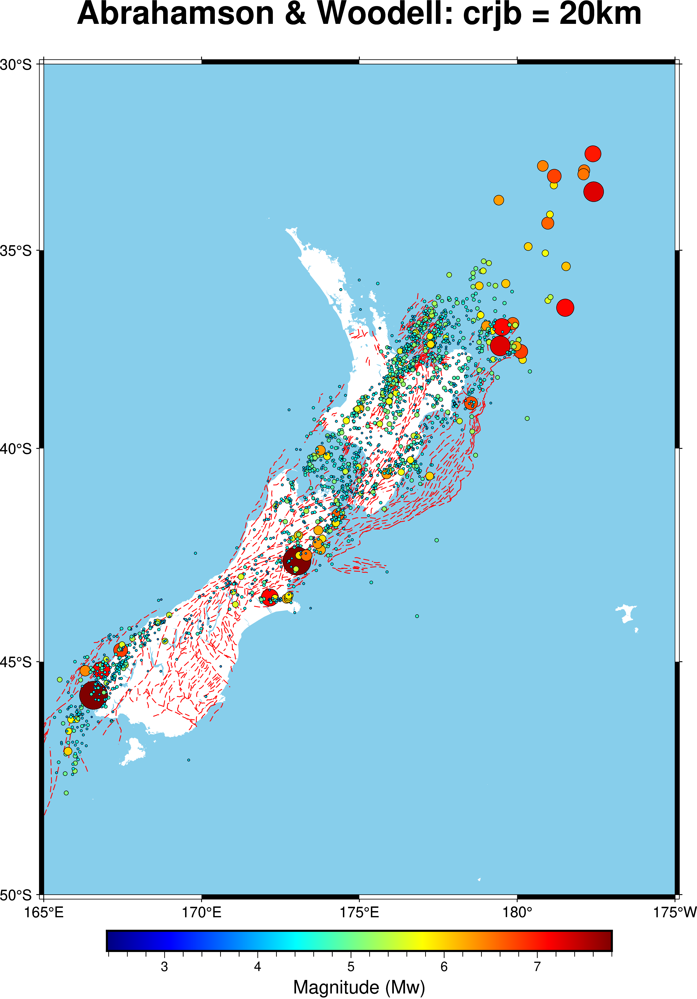

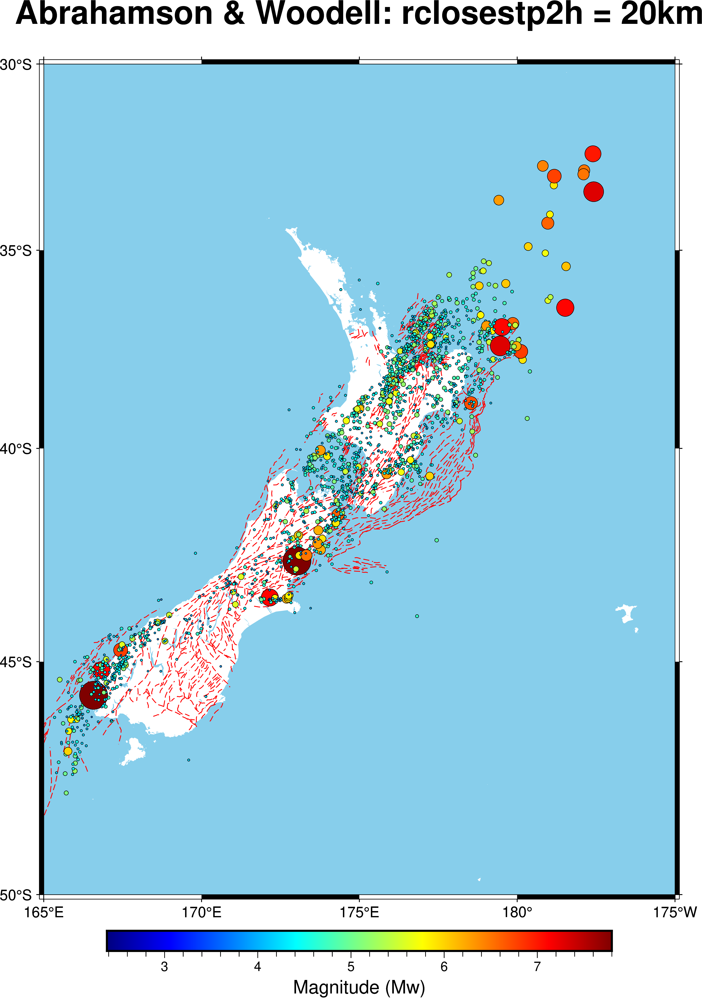

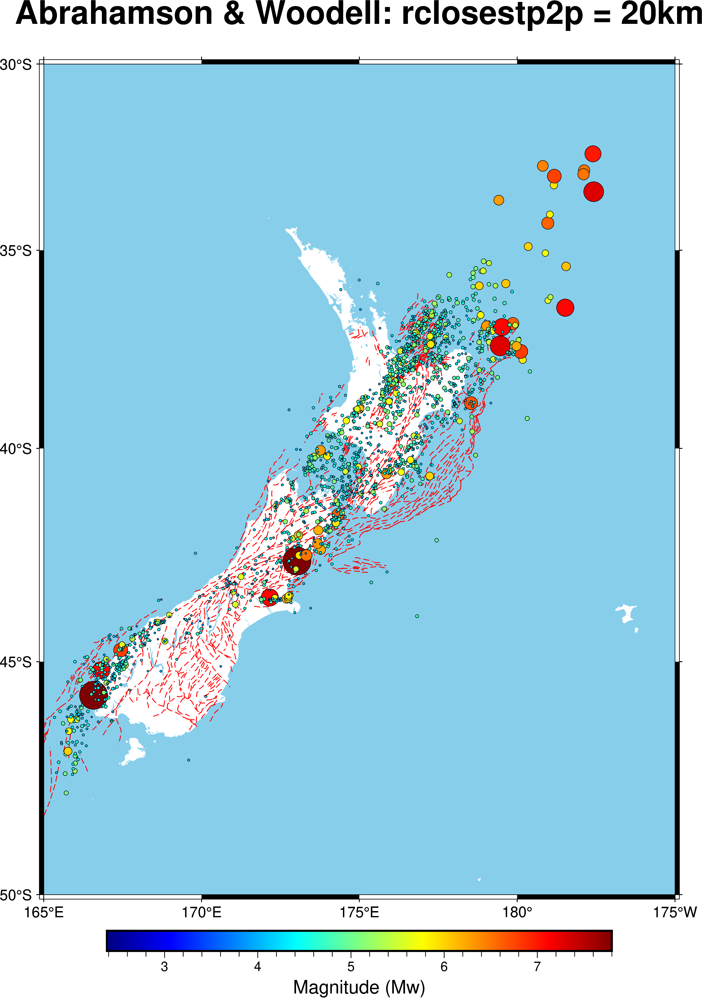

In [26]:
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_crjb20.lon,
    y=catalogue_dec_crjb20.lat,
    size=0.003 * 2 ** catalogue_dec_crjb20.mag,
    fill=catalogue_dec_crjb20.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: crjb = 20km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2h20.lon,
    y=catalogue_dec_rclosestp2h20.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2h20.mag,
    fill=catalogue_dec_rclosestp2h20.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2h = 20km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2p20.lon,
    y=catalogue_dec_rclosestp2p20.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2p20.mag,
    fill=catalogue_dec_rclosestp2p20.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2p = 20km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

## 6.5 Cut-off Distance: 30km

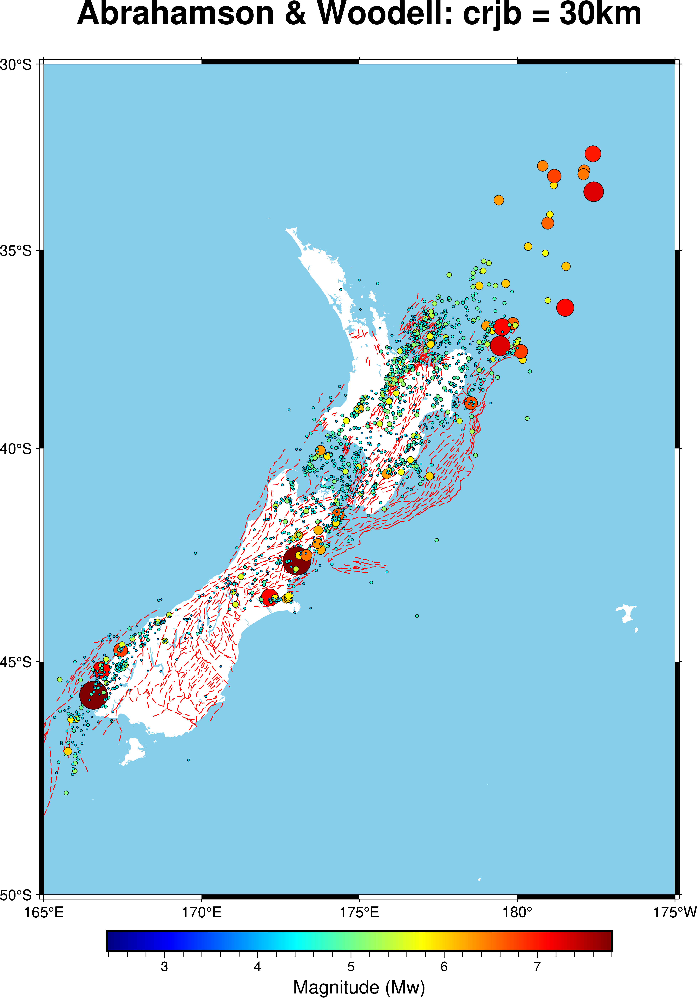

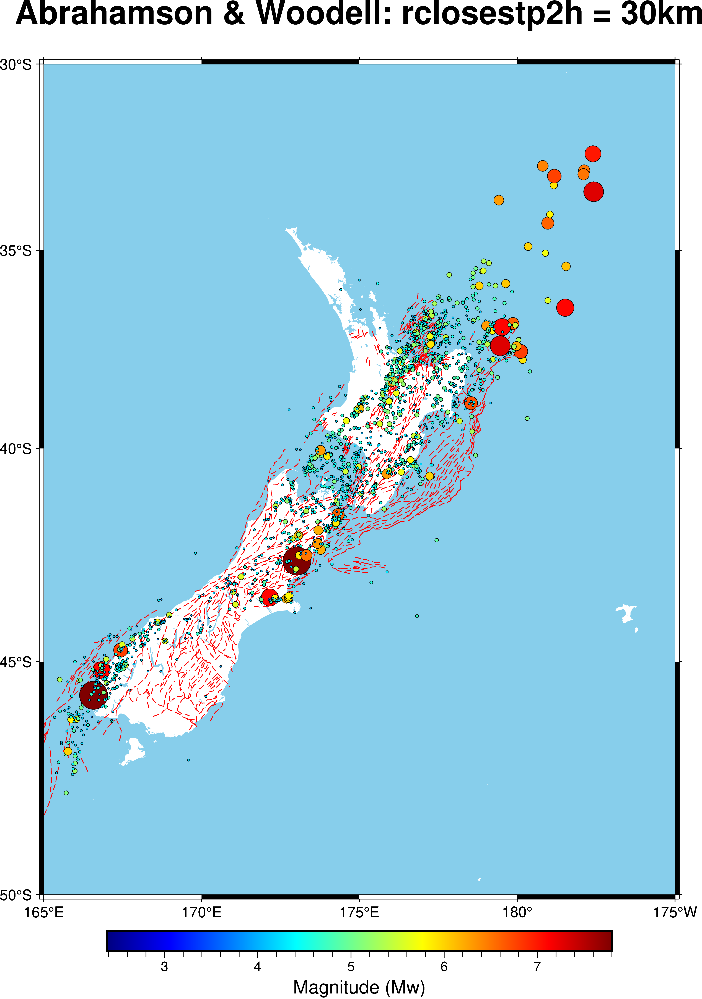

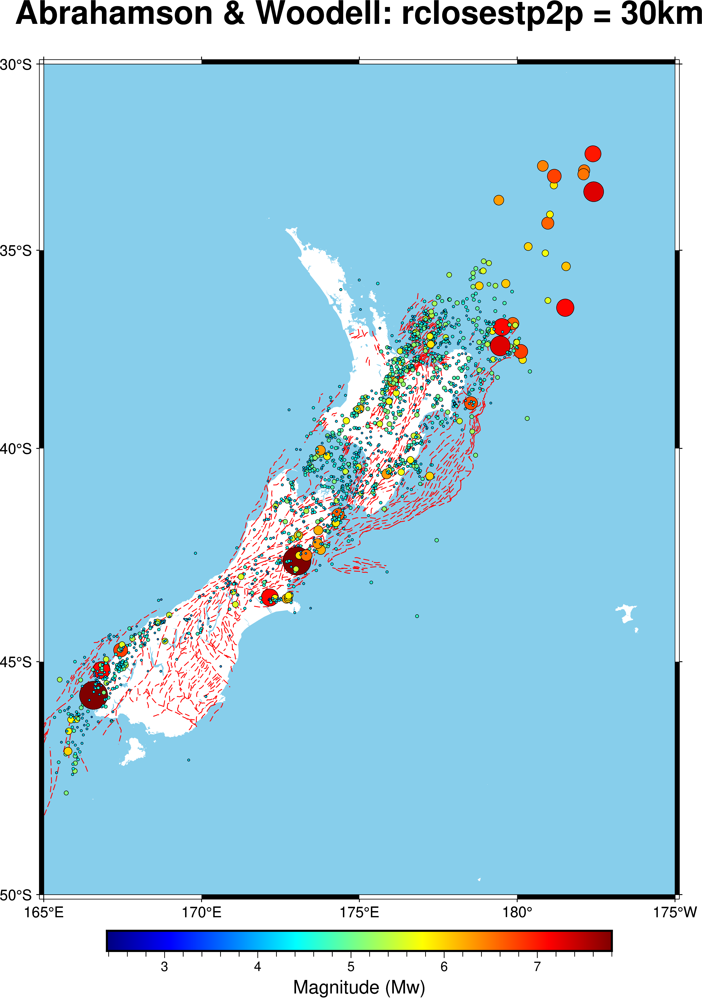

In [27]:
fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_crjb30.lon,
    y=catalogue_dec_crjb30.lat,
    size=0.003 * 2 ** catalogue_dec_crjb30.mag,
    fill=catalogue_dec_crjb30.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: crjb = 30km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2h30.lon,
    y=catalogue_dec_rclosestp2h30.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2h30.mag,
    fill=catalogue_dec_rclosestp2h30.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2h = 30km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

fig = pygmt.Figure()
fig.basemap(region=region, projection="M15c", frame=True)
fig.coast(land="white", water="skyblue")
for line in linestrings:
    x, y = line.coords.xy
    fig.plot(x=x, y=y, pen="0.5p,red,-")
pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
fig.plot(
    x=catalogue_dec_rclosestp2p30.lon,
    y=catalogue_dec_rclosestp2p30.lat,
    size=0.003 * 2 ** catalogue_dec_rclosestp2p30.mag,
    fill=catalogue_dec_rclosestp2p30.mag,
    cmap=True,
    style="cc",
    pen="black",
)
fig.basemap(frame=["a", "+tAbrahamson & Woodell: rclosestp2p = 30km"])
fig.colorbar(frame="xaf+lMagnitude (Mw)")
fig.show(method='notebook', dpi=600, width=720)

# 7.0 Spatial Plot: Animation

In [28]:
from datetime import datetime, timedelta

time = np.arange(min(decimal_yearnp), max(decimal_yearnp), 0.0135)
print(len(time))

for i in range(0, len(time)):
    idx_temp = np.where(decimal_yearnp < time[i])
    # idx_max = max(idx_temp[0])
    # filename = "Catalogue_all_%d.png" % i
    start = time[i]
    year = int(start)
    rem = start - year
    base = datetime(year, 1, 1)
    result = base + timedelta(seconds=(base.replace(year=base.year + 1) - base).total_seconds() * rem)
    result_txt = result.strftime('%Y/%m/%d')
    # print(result_txt)
    # print(filename)

i = 0
print(time[i])
print(decimal_yearnp[0])
idx_temp = np.where(decimal_yearnp <= time[i])
print(max(idx_temp[0]))
print(catalogue_pd.lon[0])

1811
2000.0470877289517
2000.0470877289517
0
167.45192


In [29]:
# from IPython.display import clear_output
# for i in range(len(time)):
#     clear_output()
#     idx_temp = np.where(decimal_yearnp <= time[i])
#     idx_max = max(idx_temp[0])
#     filename = "C:/Users/LEGION/Desktop/aftershock_all_v4p1/Catalogue_ALL_%d.png" % i
#     start = time[i]
#     year = int(start)
#     rem = start - year
#     base = datetime(year, 1, 1)
#     result = base + timedelta(seconds=(base.replace(year=base.year + 1) - base).total_seconds() * rem)
#     result_txt = result.strftime('%Y/%m/%d')
# 
#     fig = pygmt.Figure()
#     fig.basemap(region=region, projection="M15c", frame=True)
#     fig.coast(land="white", water="skyblue")
#     for line in linestrings:
#         x, y = line.coords.xy
#         fig.plot(x=x, y=y, pen="0.5p,red,-")
#     pygmt.makecpt(cmap="jet", series=[catalogue_pd.mag.min(), catalogue_pd.mag.max()])
#     if idx_max == 0:
#         fig.plot(
#         x=catalogue_pd.lon[0],
#         y=catalogue_pd.lat[0],
#         size=0.003*2**catalogue_pd.mag[0],
#         fill=catalogue_pd.mag[0],
#         cmap=True,
#         style="cc",
#         pen="black",
#         )
#     else:
#         fig.plot(
#         x=catalogue_pd.lon[0:idx_max],
#         y=catalogue_pd.lat[0:idx_max],
#         size=0.003*2**catalogue_pd.mag[0:idx_max],
#         fill=catalogue_pd.mag[0:idx_max],
#         cmap=True,
#         style="cc",
#         pen="black",
#         )
#     fig.basemap(frame=["a", "+tCatalogue: NZGMDB V4P1"])
#     fig.colorbar(frame="xaf+lMagnitude (Mw)")
#     fig.text(text=result_txt, x=165.0, y=-28, font="18p,Helvetica-Bold,white")
#     fig.show(method = 'none',dpi=600,width=720)
#     fig.savefig(filename)
#     print(i)